In [1]:
import os

import numpy as np
import pandas as pd
import seaborn as sns
import pymc3 as pm
import theano

from sklearn.metrics import confusion_matrix as conf_mat

%pylab inline
%config InlineBackend.figure_format = 'retina'
%qtconsole --colors=linux
%load_ext watermark

Populating the interactive namespace from numpy and matplotlib


In [2]:
%watermark -v -m -p numpy,pandas,seaborn,pymc3,matplotlib,theano

CPython 3.5.1
IPython 6.2.1

numpy 1.12.0
pandas 0.21.0
seaborn 0.7.0
pymc3 3.2
matplotlib 2.1.0
theano 1.0.0

compiler   : GCC 4.2.1 (Apple Inc. build 5666) (dot 3)
system     : Darwin
release    : 17.2.0
machine    : x86_64
processor  : i386
CPU cores  : 4
interpreter: 64bit


# Table of Content
[Abstract](#Abstract)  
[Experiment info](#Experiment-information-snippet)  

Load data
- [Display one subject](#Display-one-subject)  
- [Load all data](#Load-all-subject)  
- [Data filtering](#Data-Filtering)  

[Descriptive result](#Display-descriptive-result-by-age-group)  
- [Confusion Matrix](#mean-confusion-matrix)  
- [Expression recognition as the function of age](#Lineplot-of-accurate-recognition-as-a-function-of-age)  
- [Dynamic advantage](#Dynamic-advantage-as-a-function-of-age)  

[Display Raw](#Display-Raw)  

[Piece-wise regression model](#Facial-expression-recognition-as-a-function-of-age)  
- [Full model for fitting all task together](#Full-model-for-fitting-all-task-together)
- [Setup helper function for PyMC3](#Setup-helper-function-for-PyMC3)   
- [Anger](#Anger)  
- [Disgust](#Disgust)  
- [Fear](#Fear)  
- [Happy](#Happy)  
- [Sad](#Sad)    
- [Surprise](#Surprise)  

# Tracking the recognition of static and dynamic facial expressions of emotion across life span

Anne-Raphaëlle Richoz<sup>1</sup>, Junpeng Lao<sup>1</sup>, Olivier Pascalis<sup>2</sup>, and Roberto Caldara<sup>1</sup>  
*<sup>1</sup>Eye and Brain Mapping Laboratory (iBMLab), Department of Psychology, University of Fribourg, Fribourg, Switzerland*  
*<sup>2</sup>Laboratoire de Psychologie et Neurocognition (CNRS), Université Grenoble-Alpes, Grenoble, France*


## Abstract  
Dynamic social signals are steadily stimulating the visual system during human interactions. A wealth of such signals are transmitted as facial expressions for communicating internal emotional states. Unlike static snapshots, routinely used in most of the experiments, dynamic facial expressions provide observers with richer and ecologically-valid signals. Common intuition would thus suggest an advantage for the recognition of dynamic over static inputs. However, while many studies reported an advantage in the recognition of dynamic over static expressions in clinical populations ([Richoz et al., 2015](http://perso.unifr.ch/roberto.caldara/pdfs/richoz_15.pdf)), results obtained with healthy young adults are by far more contrasted. To clarify this issue, we conducted a large sample cross-sectional study to investigate facial expression recognition from early to elderly age. Over 400 observers (age range 5-100) performed recognition tasks of the six basic expressions in three conditions: static, shuffled (temporally randomized frames) and dynamic ([Gold et al., 2013](https://dx.doi.org/10.1167%2F13.5.23)). We normalized the stimuli for their low-level properties and the amount of energy sampled over time, even for the static condition. Facial expression recognition profiles revealed a better performance for “happy” and typical confusions among expressions with similar morphology (fear-surprise), regardless of condition and age. We then applied a Generalized Additive Model with smoothing spline on an efficiency index to capture the nonlinear relationship between age and the experimental conditions. Overall, we observed strong efficiency in the recognition of dynamic facial expressions in the elderly population. This observation was driven by a suboptimal performance for static and shuffled expressions, a potential marker for impaired face processing that might be linked to other facets of general cognitive decline. Our findings also posit the use of dynamic stimuli as being critical in the assessment of facial expression recognition in elderly populations, inviting to caution when drawing conclusions from the sole use of static face images to this aim.

## Experiment information snippet

### Experiment setup
Participant perform 3 different task [Dynamic,Shuffl,Static], each with 96 trials (2 sex x 6 expression x 4 identities x 2 repetition)

### Stimuli (static)

![fig1](figs/img1.jpg)

## Display one subject

In [3]:
proj_path = '/Users/jlao/Documents/Github/ibmlabStatic_dynamic'
datatmp = pd.read_csv(proj_path + '/data/S0EJJ7F_g1_a41_DyExp_beh.txt','\t',
                      header=None)
# change column name
column_name = ['Trial','Resp','ACC','RT','cRect1','cRect2','cRect3','cRect4',
               'Randseq','Task']
datatmp.columns=column_name
# change stimuli name
stim_list = pd.read_csv(proj_path + '/experiment_code/stimuli_list.csv',',')
datatmp['Expression'] = np.asarray(stim_list['Expression'].loc[datatmp['Randseq']-1])
# change response name
resp_list = np.asarray(['Fear','Anger','Disgust','Happiness','Sadness','Surprise'])
Resp = []
for iresp in datatmp['Resp']:
    if np.isfinite(iresp):
        Resp.append(resp_list[int(iresp-1)])
    else:
        Resp.append(np.nan)
datatmp['Resp_Exp'] = np.asarray(Resp)
# change task name
Taskname = np.asarray(['Dynamic','Shuffled','Static'])
datatmp['Task_nam'] = Taskname[datatmp['Task']-1]
# show dataframe (first 5 lines)
datatmp.head(5)

,Trial,Resp,ACC,RT,cRect1,cRect2,cRect3,cRect4,Randseq,Task,Expression,Resp_Exp,Task_nam
0,1,4.0,1.0,4.294451,260.5176,20.51765,1019.482,779.4824,32,3,Happiness,Happiness,Static
1,2,2.0,0.0,3.866361,260.5176,20.51765,1019.482,779.4824,40,3,Sadness,Anger,Static
2,3,6.0,0.0,4.157916,260.5176,20.51765,1019.482,779.4824,22,3,Fear,Surprise,Static
3,4,1.0,0.0,2.618769,260.5176,20.51765,1019.482,779.4824,34,3,Sadness,Fear,Static
4,5,6.0,1.0,1.904614,260.5176,20.51765,1019.482,779.4824,92,3,Surprise,Surprise,Static


In [4]:
taskorder = datatmp.Task.unique() - 1
print('The task order is:' + str(taskorder))

labellist = np.asarray(['Anger','Disgust','Fear','Happiness','Sadness','Surprise'])
for ij,itask in enumerate(Taskname):
    datatask  = datatmp[datatmp['Task_nam']==itask]
    conf_subj = conf_mat(datatask['Expression'],datatask['Resp_Exp'],labels=labellist)
    conf_df = pd.DataFrame(conf_subj,columns=labellist,index=labellist)
    conf_df['trials']=datatask['Expression'].value_counts()
    print('\n'+itask)
    print(conf_df)

The task order is:[2 1 0]

Dynamic
           Anger  Disgust  Fear  Happiness  Sadness  Surprise  trials
Anger         14        0     0          0        1         1      16
Disgust        2       12     0          0        2         0      16
Fear           0        0     4          0        1        11      16
Happiness      0        0     0         15        0         1      16
Sadness        2        0     3          0        9         0      16
Surprise       1        0     0          2        0        13      16

Shuffled
           Anger  Disgust  Fear  Happiness  Sadness  Surprise  trials
Anger         13        0     1          0        2         0      16
Disgust        3       11     0          0        2         0      16
Fear           0        0     6          0        0         6      16
Happiness      0        0     0          9        0         1      16
Sadness        4        0     3          0        8         0      16
Surprise       4        0     1          1   

Define a function for loading each subject.

In [5]:
def loadsbj(filepath,labellist,column_name,stim_list,Taskname):
    datatmp = pd.read_csv(filepath,'\t',
                          header=None)
    # change column name
    datatmp.columns=column_name
    # change stimuli name
    datatmp['Expression'] = np.asarray(stim_list['Expression'].loc[datatmp['Randseq']-1])
    # change response name
    Resp = []
    for iresp in datatmp['Resp']:
        if np.isfinite(iresp):
            Resp.append(resp_list[int(iresp-1)])
        else:
            Resp.append(np.nan)
    datatmp['Resp_Exp'] = np.asarray(Resp)
    # change task name
    datatmp['Task_nam'] = Taskname[datatmp['Task']-1]
    taskorder = datatmp.Task.unique() - 1
    conf_all = np.zeros((3,len(labellist),len(labellist)+1))
    for ij,itask in enumerate(Taskname):
        datatask  = datatmp[datatmp['Task_nam']==itask]
        if datatask.shape[0]>0:
            conf_subj = conf_mat(datatask['Expression'],datatask['Resp_Exp'],labels=labellist)
            conf_df = pd.DataFrame(conf_subj,columns=labellist,index=labellist)
            conf_df['trials']=datatask['Expression'].value_counts()
            conf_all[ij]=np.asarray(conf_df)
        
    return taskorder,np.asarray(conf_all)

Taskname = np.asarray(['Dynamic','Shuffled','Static'])
resp_list = np.asarray(['Fear','Anger','Disgust','Happiness','Sadness','Surprise'])
column_name = ['Trial','Resp','ACC','RT','cRect1','cRect2','cRect3','cRect4',
                   'Randseq','Task']
stim_list = pd.read_csv(proj_path + '/experiment_code/stimuli_list.csv',',')
labellist = np.asarray(['Anger','Disgust','Fear','Happiness','Sadness','Surprise'])

filepath = proj_path + '/data/S0EJJ7F_g1_a41_DyExp_beh.txt'
taskorder,conf_all = loadsbj(filepath,labellist,column_name,stim_list,Taskname)
print(taskorder)
print(conf_all)

[2 1 0]
[[[ 14.   0.   0.   0.   1.   1.  16.]
  [  2.  12.   0.   0.   2.   0.  16.]
  [  0.   0.   4.   0.   1.  11.  16.]
  [  0.   0.   0.  15.   0.   1.  16.]
  [  2.   0.   3.   0.   9.   0.  16.]
  [  1.   0.   0.   2.   0.  13.  16.]]

 [[ 13.   0.   1.   0.   2.   0.  16.]
  [  3.  11.   0.   0.   2.   0.  16.]
  [  0.   0.   6.   0.   0.   6.  16.]
  [  0.   0.   0.   9.   0.   1.  16.]
  [  4.   0.   3.   0.   8.   0.  16.]
  [  4.   0.   1.   1.   0.   9.  16.]]

 [[  9.   3.   0.   0.   1.   0.  16.]
  [  1.  13.   0.   0.   2.   0.  16.]
  [  0.   0.   3.   0.   0.  11.  16.]
  [  0.   0.   0.  15.   0.   0.  16.]
  [  5.   0.   3.   0.   6.   0.  16.]
  [  0.   0.   0.   6.   0.   9.  16.]]]


# Load all subject

In [6]:
Sbjall_txt = os.listdir(proj_path+'/data/')
gender = []
age = []
sbjname = []
confusionall = []
taskorderall = []
for string in Sbjall_txt:
    info = string.split(sep='_')
    gender.append(int(info[1][1:]))
    age.append(int(info[2][1:]))
    sbjname.append(info[0])
    filepath = proj_path + '/data/' + string
    taskorder,conf_all = loadsbj(filepath,labellist,column_name,stim_list,Taskname)
    confusionall.append(conf_all)
    taskorderall.append(taskorder)

In [7]:
subject_info = pd.DataFrame({'name': sbjname, 'gender': gender, 'age': age, 'taskorder':taskorderall})
confusionall = np.asarray(confusionall)
print(subject_info.head(5))
print(confusionall.shape)
print(subject_info.shape)

   age  gender     name  taskorder
0   13       2  SZNMP3B  [2, 1, 0]
1   14       1  SOOV2TX  [1, 0, 2]
2    7       2  S5YLVVA  [0, 1, 2]
3   19       1  SUZTUOJ  [0, 2, 1]
4   10       2  SWJ6KUA  [2, 0, 1]
(444, 3, 6, 7)
(444, 4)


# Data Filtering
There are some subject that did not answer one expression on the first task. Because we do not know whether they actually did not perceive that expression or did not understand the task, we excluded these subjects from the analysis.  
If subjects did not answer one expression on the second or third task, but did so on the first one, they were included in the analysis as we assumed they understood correctly the instructions.  

In [8]:
nsbj = subject_info.shape[0]
subject_info['exclude'] = np.zeros(nsbj)
for isbj, taskorder, confmat in zip(range(nsbj),subject_info['taskorder'],confusionall):
    emptyresp = np.where(np.sum(confmat[taskorder[0]],axis=0)[:6]==0)
    if emptyresp[0].size!=0:
        print('Sbj ' +str(isbj) + ' missing expression ' + str(labellist[emptyresp[0]]))
        subject_info.loc[isbj,('exclude')]=1

Sbj 11 missing expression ['Fear']
Sbj 12 missing expression ['Disgust']
Sbj 16 missing expression ['Disgust']
Sbj 57 missing expression ['Surprise']
Sbj 65 missing expression ['Disgust']
Sbj 75 missing expression ['Surprise']
Sbj 81 missing expression ['Fear']
Sbj 86 missing expression ['Disgust']
Sbj 99 missing expression ['Anger']
Sbj 113 missing expression ['Fear']
Sbj 129 missing expression ['Surprise']
Sbj 132 missing expression ['Fear']
Sbj 140 missing expression ['Sadness']
Sbj 146 missing expression ['Surprise']
Sbj 164 missing expression ['Disgust' 'Fear']
Sbj 170 missing expression ['Fear']
Sbj 189 missing expression ['Surprise']
Sbj 190 missing expression ['Disgust' 'Surprise']
Sbj 221 missing expression ['Fear']
Sbj 247 missing expression ['Fear']
Sbj 281 missing expression ['Fear']
Sbj 283 missing expression ['Fear']
Sbj 304 missing expression ['Surprise']
Sbj 315 missing expression ['Disgust']
Sbj 321 missing expression ['Fear']
Sbj 332 missing expression ['Fear']
Sbj 35

Output desciptive table for the valid subject

In [9]:
# print(subject_info.loc[subject_info['exclude']==1])
include = subject_info['exclude']==0
Info_tbl = pd.DataFrame.copy(subject_info.loc[include]).reset_index()
Conf_mat = confusionall[include,:,:,:]
gendervec = np.asarray(Info_tbl['gender']) - 1
Info_tbl['gender'] = pd.Categorical.from_codes(gendervec, categories=["female", "male"])

print('The total sample size is: '+ str(Info_tbl.shape[0]))
bins = [4, 6, 8, 10, 12, 14, 16, 18, 20, 30, 40, 50, 60, 70, 80, 100]
group_names = ['a05-06', 'a07-08', 'a09-10', 'a11-12', 'a13-14', 'a15-16',
               'a17-18', 'a19-20', 'a21-30', 'a31-40', 'a41-50', 'a51-60',
               'a61-70', 'a71-80', 'a81-99']
group_order = np.arange(0,len(bins)-1)
Info_tbl['age_group'] = pd.cut(Info_tbl['age'], bins, labels=group_names)
Info_tbl['age_group2'] = pd.cut(Info_tbl['age'], bins, labels=group_order)
Info_tbl['age_mean'] = np.zeros((len(Info_tbl)))
for iage in Info_tbl['age_group'].unique():
    idex = Info_tbl['age_group']==iage
    Info_tbl.loc[idex,('age_mean')] = np.mean(Info_tbl['age'][idex])

print('\nNumber of subject per age group:')
Descriptive1 = pd.DataFrame({'Num_sbj':Info_tbl.groupby(['age_group']).size()}).reset_index()
print(Descriptive1)
Descriptive2 = pd.DataFrame({'Num_sbj':Info_tbl.groupby(['age_group','gender']).size()}).reset_index()
print('\nNumber of subject per age group (by gender):')
print(Descriptive2)

The total sample size is: 412

Number of subject per age group:
   age_group  Num_sbj
0     a05-06       27
1     a07-08       24
2     a09-10       22
3     a11-12       22
4     a13-14       24
5     a15-16       21
6     a17-18       21
7     a19-20       31
8     a21-30       31
9     a31-40       23
10    a41-50       33
11    a51-60       30
12    a61-70       32
13    a71-80       31
14    a81-99       40

Number of subject per age group (by gender):
   age_group  gender  Num_sbj
0     a05-06  female       17
1     a05-06    male       10
2     a07-08  female       17
3     a07-08    male        7
4     a09-10  female       11
5     a09-10    male       11
6     a11-12  female       14
7     a11-12    male        8
8     a13-14  female       10
9     a13-14    male       14
10    a15-16  female        8
11    a15-16    male       13
12    a17-18  female       16
13    a17-18    male        5
14    a19-20  female       27
15    a19-20    male        4
16    a21-30  female       2

# Display descriptive result by age group
### mean confusion matrix

In [10]:
exp_list  = np.asarray(['Anger','Disgust','Fear','Happy','Sad','Surprise'])
resp_list = np.asarray(['Anger','Disgust','Fear','Happy','Sad','Surprise','Null'])
Tasksel = ['Dynamic', 'Static', 'Shuffled']


Confusion Matrix for group a05-06


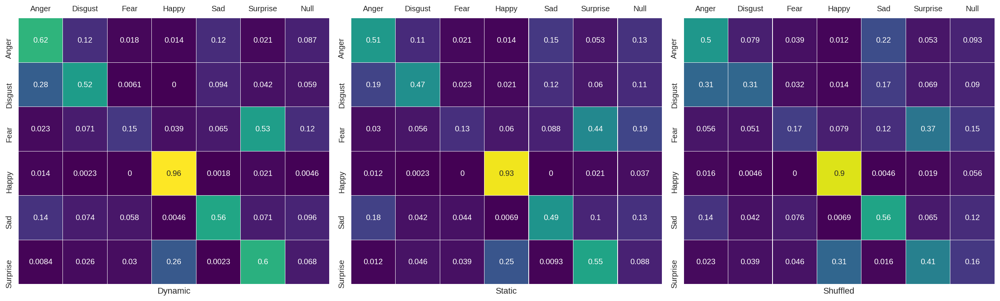


Confusion Matrix for group a07-08


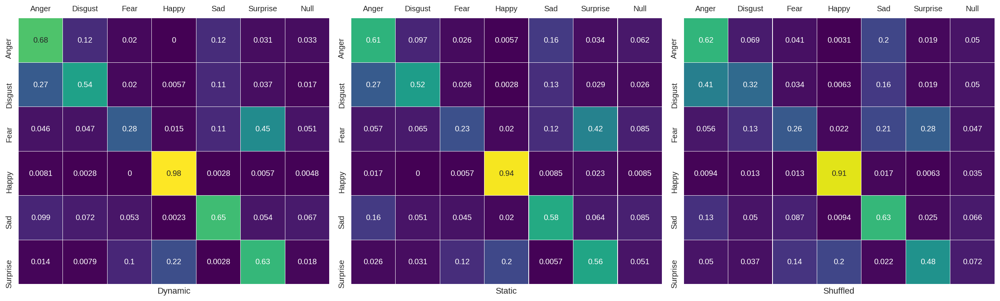


Confusion Matrix for group a09-10


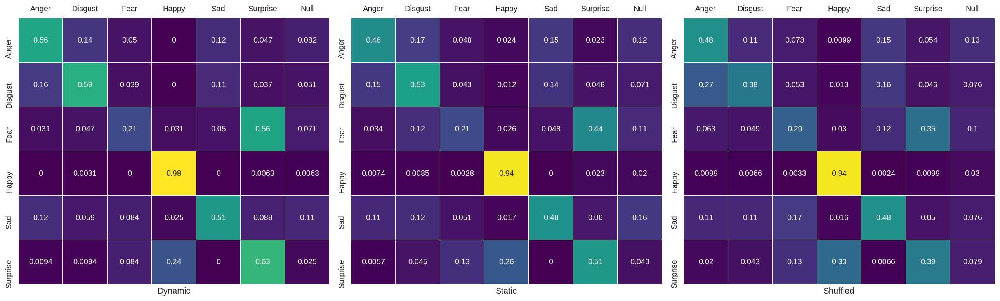


Confusion Matrix for group a11-12


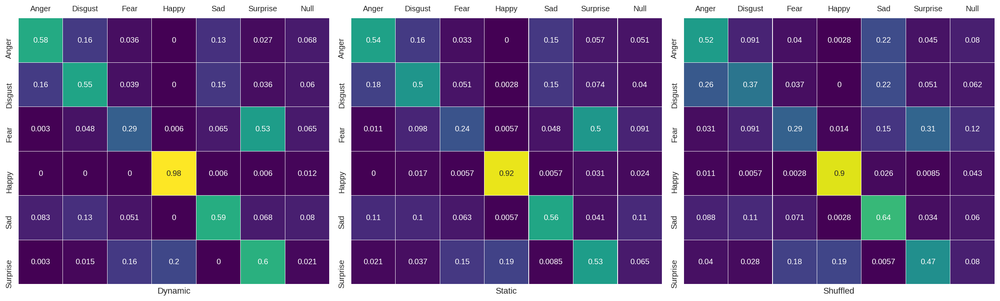


Confusion Matrix for group a13-14


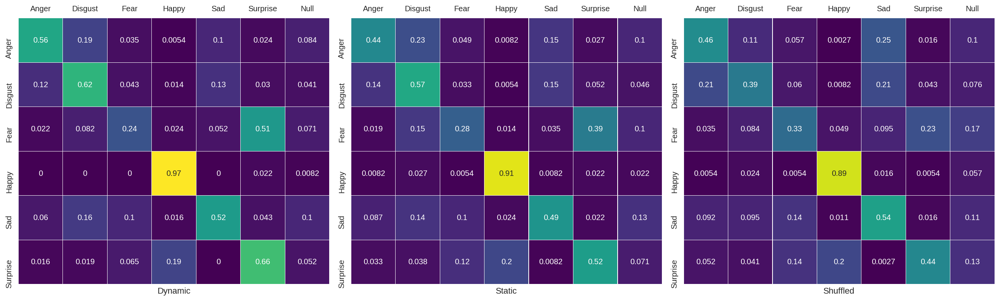


Confusion Matrix for group a15-16


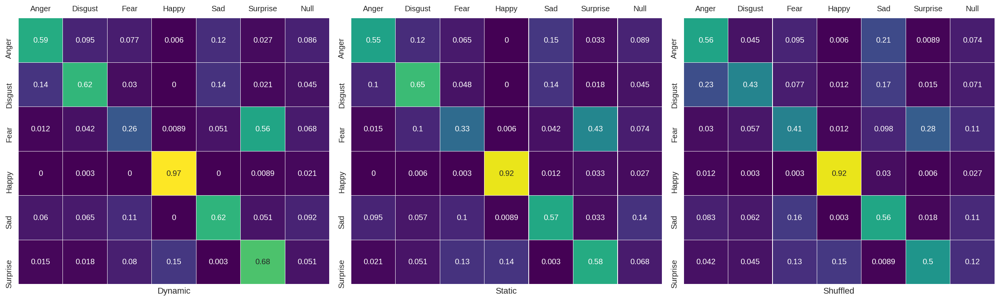


Confusion Matrix for group a17-18


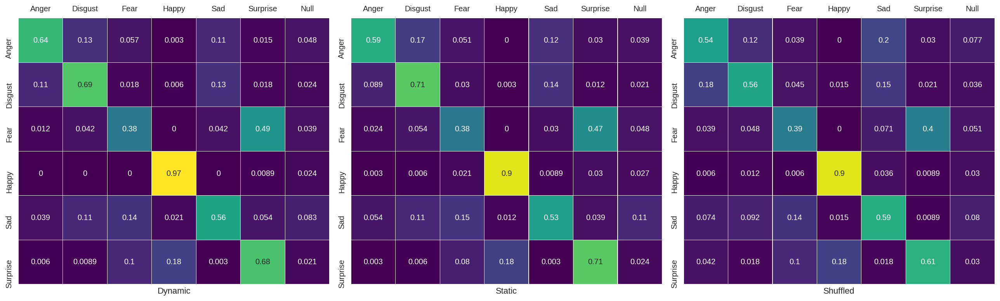


Confusion Matrix for group a19-20


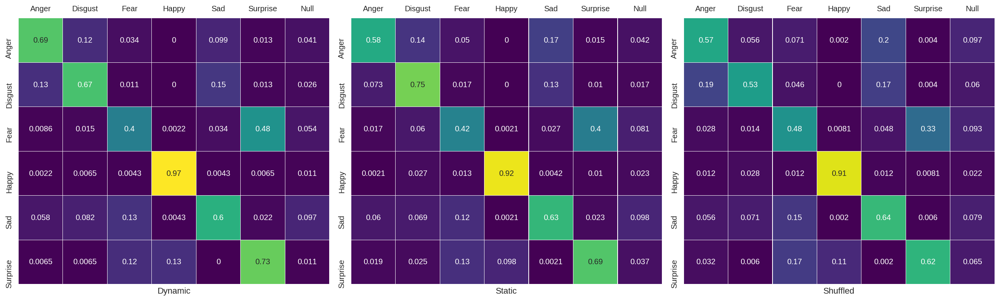


Confusion Matrix for group a21-30


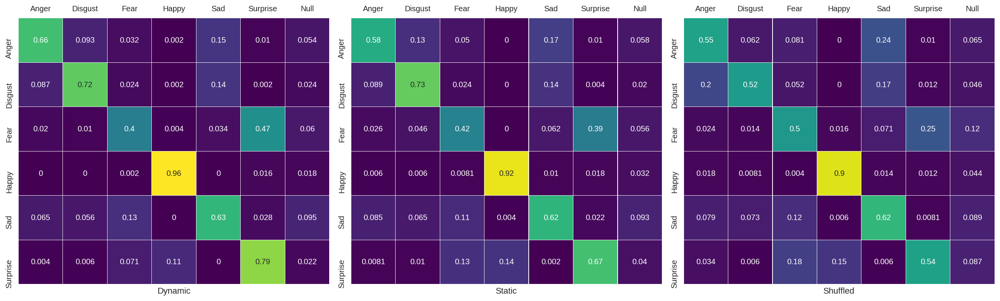


Confusion Matrix for group a31-40


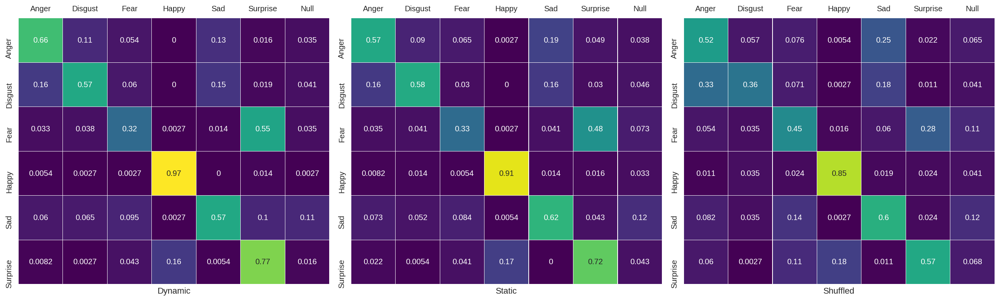


Confusion Matrix for group a41-50


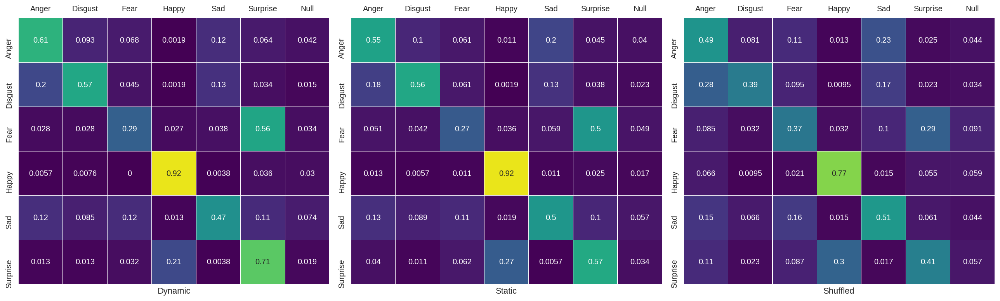


Confusion Matrix for group a51-60


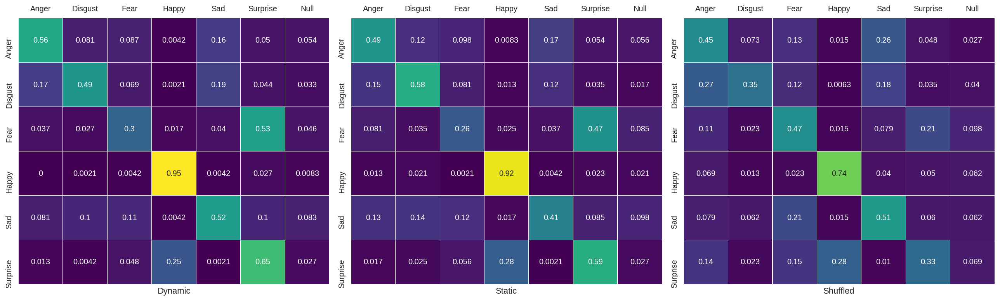


Confusion Matrix for group a61-70


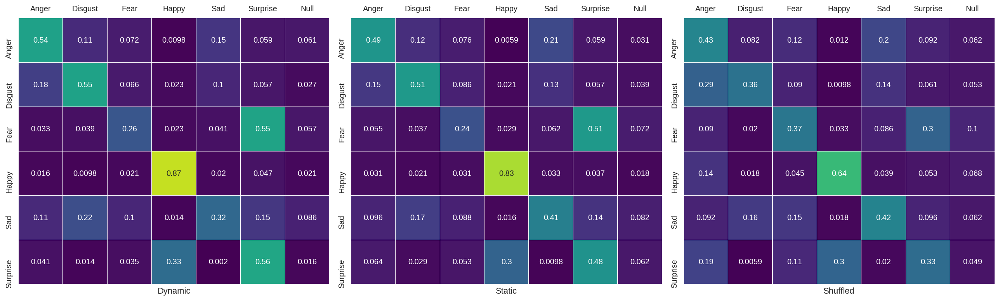


Confusion Matrix for group a71-80


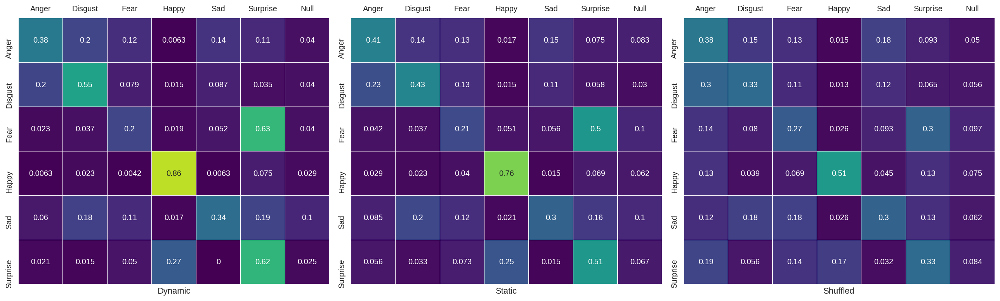


Confusion Matrix for group a81-99


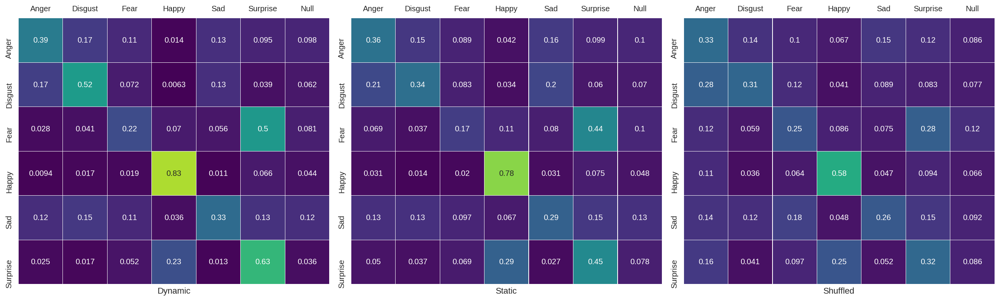

In [11]:
for iage, tblage in Info_tbl.groupby('age_group'):
    print('\nConfusion Matrix for group '+str(iage))
    Conftmp = Conf_mat[tblage.index,:,:,:6]
    Conftrl = Conf_mat[tblage.index,:,:,6]
    tmp = Conftrl-np.sum(Conftmp,axis=3)
    Conftmp2 = np.concatenate((Conftmp,np.expand_dims(tmp,axis=3)),axis=3)
    trialnum = np.reshape(np.repeat(Conftrl,7,axis=2),newshape=Conftmp2.shape)
    Confgroup = Conftmp2/trialnum
    if sum(Confgroup>1)>0:
        print('Error at group '+str(iage))
    plt.figure(figsize=(18,6))
    for ij,itask in enumerate(Tasksel):
        idx = np.where(Taskname == itask)[0][0]
        mattmp  = Confgroup[:,idx,:,:]
        meanmat = np.mean(mattmp[np.isfinite(mattmp[:,0,0]),:,:],axis=0)
        conf_mean = pd.DataFrame(meanmat,columns=resp_list,index=exp_list)
        ax = plt.subplot(1,3,ij+1)
        sns.heatmap(conf_mean, annot=True, vmin=0,vmax=.95,cbar=False, square = True,
                    linewidths=.1, cmap='viridis',ax=ax)
        ax.xaxis.tick_top()
        plt.xlabel(itask)
    plt.tight_layout()
    plt.show()

### Lineplot of accurate recognition as a function of age
It is the same as displaying the diagonal of the confusion matrix

In [12]:
Conftmp = Conf_mat[:,:,:,:6]
# NaN response as ignore
# Conftrl = np.sum(Conftmp,axis=3)
# trialnum = np.reshape(np.repeat(Conftrl,6,axis=2),newshape=Conftmp.shape)
# NaN response as incorrect
trialnum = np.reshape(np.repeat(Conf_mat[:,:,:,6],6,axis=2),newshape=Conftmp.shape)
Confmean = Conftmp/trialnum

In [13]:
itask = 'Dynamic'
print('Preparing '+str(itask)+' condition')
idx = np.where(Taskname == itask)[0][0]
mattmp  = Confmean[:,idx,:,:]

datatbl1 = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl1[emolabel] = mattmp[:,ic,ic]

Preparing Dynamic condition


In [14]:
itask = 'Static'
print('Preparing '+str(itask)+' condition')
idx = np.where(Taskname == itask)[0][0]
mattmp  = Confmean[:,idx,:,:]

datatbl2 = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl2[emolabel] = mattmp[:,ic,ic]

Preparing Static condition


In [15]:
itask = 'Shuffled'
print('Preparing '+str(itask)+' condition')
idx = np.where(Taskname == itask)[0][0]
mattmp  = Confmean[:,idx,:,:]

datatbl3 = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl3[emolabel] = mattmp[:,ic,ic]

Preparing Shuffled condition


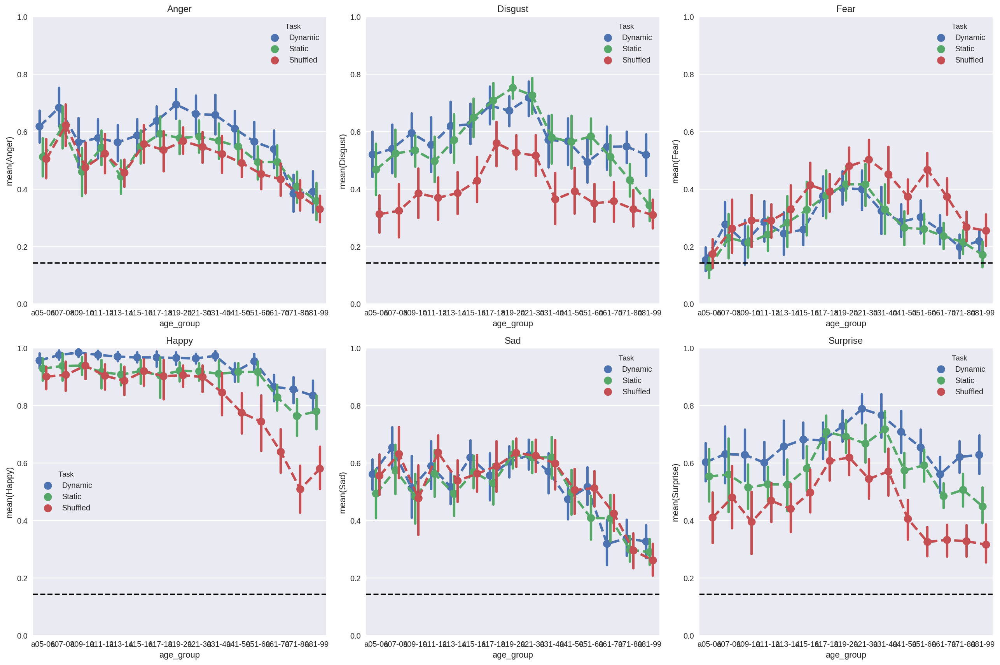

In [16]:
datatbl1['Task'] = 'Dynamic'
datatbl2['Task'] = 'Static'
datatbl3['Task'] = 'Shuffled'
datatbl_123 = pd.concat([datatbl1,datatbl2,datatbl3])

plt.figure(figsize=(18,12))
for ic, emolabel in enumerate(exp_list):
    ax = plt.subplot(2,3,ic+1)
    sns.pointplot(x="age_group", y=emolabel, hue='Task', dodge=.35, linestyles='--',
                  data=datatbl_123, estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    ax.axhline(1/7,linestyle='--', color='k')
    ax.set_ylim(0,1)
    plt.title(emolabel)
    
plt.tight_layout();
plt.savefig('./figs/Average_by_agegroup.svg', format='svg', dpi=300)

### Dynamic advantage as a function of age

Displaying difference: Dynamic - Static


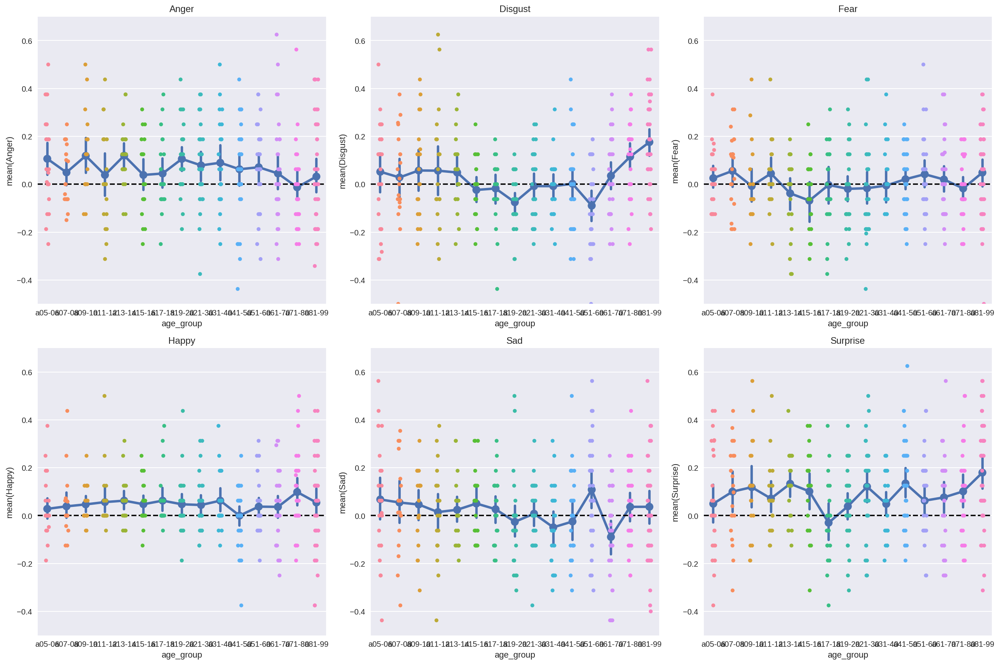

In [17]:
itask1 = 'Dynamic'
idx1 = np.where(Taskname == itask1)[0][0]
itask2 = 'Static'
idx2 = np.where(Taskname == itask2)[0][0]
mattmp  = Confmean[:,idx1,:,:]-Confmean[:,idx2,:,:]
print('Displaying difference: Dynamic - Static')

plt.figure(figsize=(18,12))
datatbl = pd.DataFrame.copy(Info_tbl)
for ic, emolabel in enumerate(exp_list):
    datatbl[emolabel] = mattmp[:,ic,ic]

    ax = plt.subplot(2,3,ic+1)
    sns.stripplot(x="age_group", y=emolabel, data=datatbl, jitter=True, ax=ax);
    sns.pointplot(x="age_group", y=emolabel, data=datatbl, estimator=np.mean, ci=95, n_boot=1000, ax=ax);
    ax.axhline(0,linestyle='--', color='k')
    plt.title(emolabel)
    plt.ylim([-.5,.7])
    #plt.ylim([-.2,.2])
    
plt.tight_layout();

### Display Raw

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Displaying Dynamic condition
Displaying Static condition
Displaying Shuffled condition


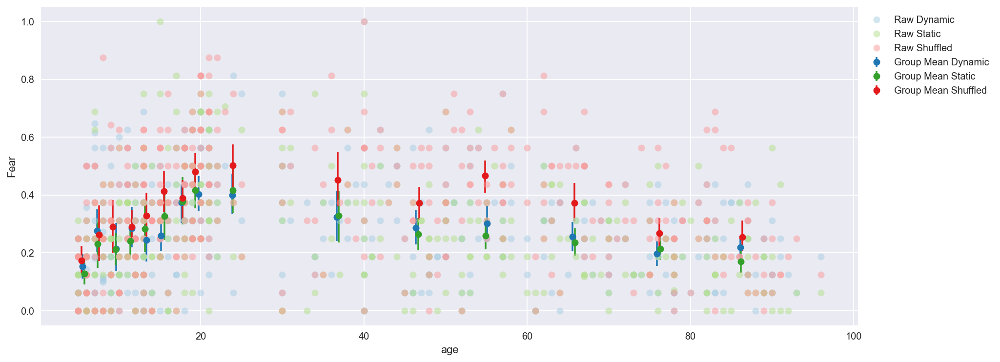

In [18]:
def plotraw(itask,emolabel,datatbl_123,ax):
    print('Displaying '+str(itask)+' condition')
    dftmp = datatbl_123.loc[datatbl_123['Task']==itask]
    ax.plot(dftmp['age'],dftmp[emolabel],'o',alpha=.5,label='Raw '+itask)

    Nboot = 1000
    age_mean, acc_mean, acc_ci = [] , [] , []
    for iage in dftmp['age_mean'].unique():
        idex = dftmp['age_mean']==iage
        age_mean.append(iage)
        respvec = dftmp[emolabel][idex]
        meanvec = np.nanmean(np.random.choice(respvec,(len(respvec),Nboot)),axis=0)

        acc_mean.append(np.nanmean(respvec))
        acc_ci.append(np.percentile(meanvec,[2.5,97.5]))
    age_mean=np.asarray(age_mean)
    acc_mean=np.asarray(acc_mean)
    acc_ci=np.asarray(acc_ci)
    acc_ci[:,0]=acc_mean-acc_ci[:,0]
    acc_ci[:,1]=acc_ci[:,1]-acc_mean
    ax.errorbar(age_mean + (np.random.rand(age_mean.shape[0])-.5)*.5, acc_mean,
                yerr=acc_ci.transpose(), fmt='o', label='Group Mean '+itask)
    
    ax.legend(loc=2, bbox_to_anchor=(1, 1))
    plt.ylabel(emolabel)
    plt.xlabel('age')
    
# itask  = 'Dynamic'
emolabel = 'Fear'
fig,ax= plt.subplots(1,1,figsize=(15,6))
# ax.set_color_cycle(['b', 'b', 'g', 'g', 'r', 'r'])
ax.set_color_cycle(sns.color_palette("Paired"))
for itask in ['Dynamic','Static','Shuffled']:
    plotraw(itask,emolabel,datatbl_123,ax=ax)

plt.show()

# Facial expression recognition as a function of age
We are interested in the dynamic advantage of facial expression, as displayed above, expression recognition accuracy follow a curve of first increase and then decrease. Moreover, some expression shows a general dynamic display advantage (i.e., higher accuracy in dynamic versus static condition). However, the question remains whether there is a stronger dynamic advantage when the biological system is a more fragile statue (i.e., in the early age when the system still developing, and in the later age when the system is in decline).

0.69 0.335
0.57 0.63


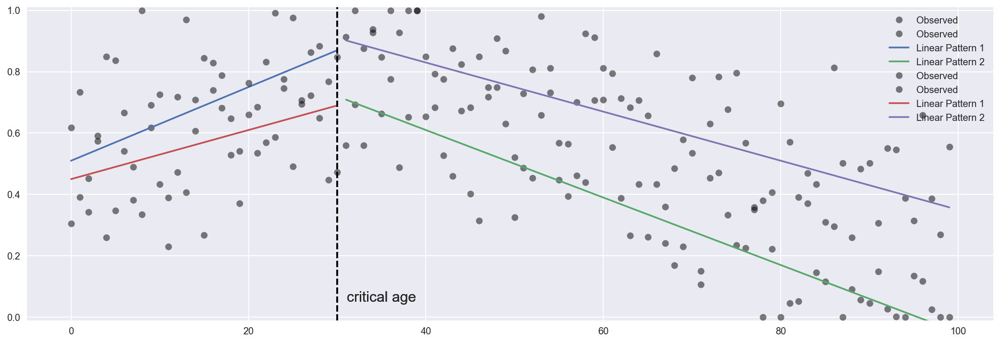

In [20]:
def emo_reg_model(intercept1,intercept2,critical_age,slope1,slope2,noise_level,
                  lmfunc=lambda intcept, delta, x: intcept + (delta*x)):
    '''
    critical_age: the onset age of cognitive decline
    intercept1: average recogtnition ability before the critical age
    intercept2: average recogtnition ability after the critical age
    slope1,slope2: linear function between age and recognition ability
    '''
    age1 = 0
    age2 = 100
    
    x1 = np.arange(age1,critical_age+1)
    y1 = lmfunc(intercept1,slope1,x1)
    noise1 = np.random.randn(len(x1))*noise_level
    x2 = np.arange(critical_age+1,age2)
    y2 = lmfunc(intercept2,slope2,x2) 
    noise2 = np.random.randn(len(x2))*noise_level
    
    y1real = np.clip(y1+noise1,0,1)
    y2real = np.clip(y2+noise2,0,1)
    print(y1.mean(),y2.mean())
    ax1=plt.plot(x1,y1real,'o',x2,y2real,'o',color='k',alpha=.5,label='Observed')
    ax2=plt.plot(x1,y1,label='Linear Pattern 1')
    ax3=plt.plot(x2,y2,label='Linear Pattern 2')
    plt.legend()
    plt.axvline(critical_age,linestyle='--', color='k')
    plt.text(critical_age+5, .05, r"critical age",
         horizontalalignment='center', fontsize=15)
    plt.ylim([-.01,1.01])

fig, ax = plt.subplots(1,1,figsize=(18,6))
emo_reg_model(.51,1.05,30,0.012,-0.011,.15)
emo_reg_model(.45,1.15,30,0.008,-0.008,.15)
ax.set_rasterized(True)
plt.savefig('./figs/Step_linear_concept.svg', format='svg', dpi=300)

In frequensitic statistics, this is a [Piecewise Linear Regression Models](https://en.wikipedia.org/wiki/Piecewise_linear_function) (see [here](https://onlinecourses.science.psu.edu/stat501/node/310), [here](http://datacolada.org/27), and [Preprint from Uri Simonsohn](https://papers.ssrn.com/sol3/papers.cfm?abstract_id=3021690) explaining why it is more appropreate than fitting a U-shape function expressed as high degree polynomial function). 
Here, we will express it as a Hierarchical Bayesian model and fitted in [PyMC3](https://github.com/pymc-devs/pymc3):


## Full model for fitting all task together
  
$i$ for each task (dynamic, static, shuffle), $j$ for each participant.

$$
\begin{align*}
\text{Hyperpriors of the slope} \\
    \mu_{\beta} 
        & \sim \text{StudentT}(3, 0, 10) \\
    \sigma_{\beta} 
        & \sim \text{HalfNormal}(10) \\
    \text{Hyper-prior of the breakpoint} \\
    \tau 
        & \sim \text{Uniform}(0, 100) \\
    \text{Hyperprior of the recognition ability at $\tau$} \\
    \theta 
        & \sim \text{Uniform}(0, 1) \\
    \kappa  
        & \sim \text{Uniform}(0, Nt) \\
    \text{(reparameterized as the mode of $\text{Beta}$ Distribution)} \\
    \text{$a$} 
        & = \theta \cdot (\kappa - 2) + 1 \\
    \text{$b$} 
        & = (1 - \theta) \cdot (\kappa - 2) + 1 \\
\end{align*}
$$

$$
\begin{align*}
\text{For each stimuli type $i \in$ {static, dynamic, shuffled}:} \\
    \text{Prior of the recognition ability at $\tau$} \\
    \theta_{i}
    & \sim \text{Beta}(\text{$a$}, \text{$b$}) \\
    \text{Priors of the breakpoint} \\
    \tau_{i}
        & \sim \text{Normal}(\tau, 10) \\    
    \text{Priors of the slopes ($a$ indicates before age $\tau$)} \\
    \beta_{i}^{a,b}
        & \sim \text{Normal}(\mu_{\beta}, \sigma_{\beta}) \\
    \text{The intercepts before and after age $\tau$} \\
    b_{i}^{a,b} 
        & = logit(\theta_{i}) - \tau_{i} \cdot \beta_{i}^{a,b} \\
    \text{Linear function and invlogit transform} \\
    \beta_{i}, Intercept_{i} 
        & =
        \begin{cases}
        \beta_{i}^{a}, b_{i}^{a}  & \text{if $age < \tau_{i}$} \\
        \beta_{i}^{b}, b_{i}^{b}  & \text{if $age \geq \tau_{i}$} \\
        \end{cases} \\
    \theta_{i,j} 
        & = \beta_{i} \times age_{j} + \text{$Intercept$}_{i} \\
    \hat{y}_{i,j} 
        & = \text{invlogit}(\theta_{i,j}) \\
    \text{Observed accurate categorizations} \\
    \text{k}_{i,j} 
        & \sim \text{Binomial}(\hat{y}_{i,j}, \text{n}_{i,j}) \\
\end{align*}
$$

In [21]:
agemin = Info_tbl['age'].min()
agemax = Info_tbl['age'].max()

def model3_diff(emolabel,Nsample=2000):
    X1,Y1,T1 = getdata('Dynamic',emolabel)
    X2,Y2,T2 = getdata('Static',emolabel)
    X3,Y3,T3 = getdata('Shuffled',emolabel)
    agemin = X1.min()
    agemax = X1.max()

    Nt = 16 # number of trials by design
    logitwithdiff = pm.Model()
    with logitwithdiff:
        # Hyperpriors for slope
        mu_beta = pm.StudentT('mu_beta', nu=3, mu=0., sd=10.0)
        sigma_beta = pm.HalfNormal('sigma_beta', sd=10.0)

        # τ ∼ Uniform(0,100)
        tau = pm.Uniform('tau', lower=agemin, upper=agemax)
        tausigma = 10.
        tau1 = pm.Normal('tau1', mu=tau, sd=tausigma)
        tau2 = pm.Normal('tau2', mu=tau, sd=tausigma)
        tau3 = pm.Normal('tau3', mu=tau, sd=tausigma)

        # Recognition ability at τ 
        theta = pm.Uniform('theta', lower=0, upper=1)
        kappa_m2 = pm.Uniform('kappa',lower=0, upper=Nt-2)
        alpha = theta * kappa_m2 + 1
        beta = (1-theta) * kappa_m2 + 1
        thetak1 = pm.Beta('thetak1', alpha=alpha, beta=beta)
        thetak2 = pm.Beta('thetak2', alpha=alpha, beta=beta)
        thetak3 = pm.Beta('thetak3', alpha=alpha, beta=beta)
        
        # Model the slope
        beta1 = pm.Normal('beta1', mu=mu_beta, sd=sigma_beta, shape=2)
        beta2 = pm.Normal('beta2', mu=mu_beta, sd=sigma_beta, shape=2)
        beta3 = pm.Normal('beta3', mu=mu_beta, sd=sigma_beta, shape=2)
        # Model the intercept
        b1 = pm.Deterministic('b1', pm.math.logit(thetak1) - tau1*beta1)
        b2 = pm.Deterministic('b2', pm.math.logit(thetak2) - tau2*beta2)
        b3 = pm.Deterministic('b3', pm.math.logit(thetak3) - tau3*beta3)
        
        beta_vect1 = pm.math.switch(tau1 >= X1, beta1[0], beta1[1])
        beta_vect2 = pm.math.switch(tau2 >= X2, beta2[0], beta2[1])
        beta_vect3 = pm.math.switch(tau3 >= X3, beta3[0], beta3[1])
        b_vect1    = pm.math.switch(tau1 >= X1, b1[0], b1[1])
        b_vect2    = pm.math.switch(tau2 >= X2, b2[0], b2[1])
        b_vect3    = pm.math.switch(tau3 >= X3, b3[0], b3[1])
        
        # θ = β∗age + Intercept
        theta1 = beta_vect1 * X1 + b_vect1
        yhat1 = pm.math.invlogit(theta1)
        theta2 = beta_vect2 * X2 + b_vect2
        yhat2 = pm.math.invlogit(theta2)
        theta3 = beta_vect3 * X3 + b_vect3
        yhat3 = pm.math.invlogit(theta3)
        
        obs1 = pm.Binomial('obs1', p=yhat1, n=T1, observed=Y1)
        obs2 = pm.Binomial('obs2', p=yhat2, n=T2, observed=Y2)
        obs3 = pm.Binomial('obs3', p=yhat3, n=T3, observed=Y3)

        # differences of slope
        dync_stac = pm.Deterministic('dync_stac',beta1-beta2)
        dync_shuf = pm.Deterministic('dync_shuf',beta1-beta3)
        shuf_stac = pm.Deterministic('shuf_stac',beta3-beta2)
        
        # general dynamic advantage
        dync_adv1 = pm.Deterministic('dync_adv1',pm.math.invlogit(beta1[0]*(agemin+tau)/2+b1[0]) - 
                                                 pm.math.invlogit(beta2[0]*(agemin+tau)/2+b2[0]))
        dync_adv2 = pm.Deterministic('dync_adv2',pm.math.invlogit(beta1[1]*(agemax+tau)/2+b1[1]) - 
                                                 pm.math.invlogit(beta2[1]*(agemax+tau)/2+b2[1]))
        
        shuf_adv1 = pm.Deterministic('shuf_adv1',pm.math.invlogit(beta3[0]*(agemin+tau)/2+b3[0]) - 
                                                 pm.math.invlogit(beta2[0]*(agemin+tau)/2+b2[0]))
        shuf_adv2 = pm.Deterministic('shuf_adv2',pm.math.invlogit(beta3[1]*(agemax+tau)/2+b3[1]) - 
                                                 pm.math.invlogit(beta2[1]*(agemax+tau)/2+b2[1]))
        
        dy_sh_adv1 = pm.Deterministic('dy_sh_adv1',pm.math.invlogit(beta1[0]*(agemin+tau)/2+b1[0]) - 
                                                   pm.math.invlogit(beta3[0]*(agemin+tau)/2+b3[0]))
        dy_sh_adv2 = pm.Deterministic('dy_sh_adv2',pm.math.invlogit(beta1[1]*(agemax+tau)/2+b1[1]) - 
                                                   pm.math.invlogit(beta3[1]*(agemax+tau)/2+b3[1]))
        
        trace = pm.sample(Nsample, tune=1000, njobs=4, init='advi+adapt_diag')
        
#     with logitwithdiff:
#         v_params = advi.advi(n=200000)
#         start = advi.sample_vp(v_params, 1, progressbar=False, hide_transformed=False)[0]
#         cov = np.power(logitwithdiff.dict_to_array(v_params.stds), 2)
#         step = pm.NUTS(scaling=cov, is_cov=True)
#         trace = pm.sample(Nsample, njobs=2, step=step, start=start, tune=5000)
        
    return trace

### Setup helper function for PyMC3

In [22]:
def getdata(itask,emolabel,agevec='age'):
    idx1 = np.where(Taskname == itask)[0][0]
    mattmp  = Conf_mat[:,idx1,:,:]
    ic = np.where(exp_list == emolabel)[0][0]
    Resp   = mattmp[:,ic,ic].astype(int)
    trials = mattmp[:,ic,-1].astype(int)
    age    = np.asarray(Info_tbl[agevec])

    incld = (np.isfinite(Resp)) & (trials > 0)
    X = age[incld]
    Y = Resp[incld]
    T = trials[incld]
    return X,Y,T

def plotfitted(agemin,critical_age,agemax,beta,intercept,cc='r'):
    lmfunc = lambda x,b,c: 1/(1+np.exp(-(x*b+c)))
    x1 = np.linspace(agemin,critical_age,100)
    y1 = lmfunc(x1,beta[0],intercept[0])
    x2 = np.linspace(critical_age,agemax,100)
    y2 = lmfunc(x2,beta[1],intercept[1])
    plt.plot(x1,y1,x2,y2,label='linear fit',color=cc,lw=3.)
    plt.axvline(critical_age,linestyle='--', color='k')
    plt.ylim((-.05,1.05))

helper function of reading out from trace (both task modeling)

In [38]:
def plot_samplerstat(burnin,trace):
    # Sampler statistics
    #pm.effective_n(trace)
    #pm.gelman_rubin(trace)
    
    accept = trace.get_sampler_stats('mean_tree_accept', burn=burnin)
    print('The accept rate is: %.5f' % (accept.mean()))
    diverge = trace.get_sampler_stats('diverging')
    print('Diverge of the trace')
    print(diverge.nonzero())
    energy = trace['energy']
    energy_diff = np.diff(energy)
    sns.distplot(energy - energy.mean(), label='energy')
    sns.distplot(energy_diff, label='energy diff')
    plt.legend()
    plt.show()

def plot_selectposterior(burnin,trace):
    pm.plot_posterior(trace[burnin:],varnames=['beta1','beta2','beta3'],ref_val=0,color='#87ceeb')
    
    df_stmp = pm.df_summary(trace[burnin:],varnames=['tau'])
    trace_age = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['tau1'])
    trace_age1 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['tau2'])
    trace_age2 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['tau3'])
    trace_age3 = np.asarray(df_stmp['mean'])
    
    df_stmp = pm.df_summary(trace[burnin:],varnames=['b1'])
    trace_intercept1 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['beta1'])
    trace_beta1 = np.asarray(df_stmp['mean'])
    
    df_stmp = pm.df_summary(trace[burnin:],varnames=['b2'])
    trace_intercept2 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['beta2'])
    trace_beta2 = np.asarray(df_stmp['mean'])
    
    df_stmp = pm.df_summary(trace[burnin:],varnames=['b3'])
    trace_intercept3 = np.asarray(df_stmp['mean'])
    df_stmp = pm.df_summary(trace[burnin:],varnames=['beta3'])
    trace_beta3 = np.asarray(df_stmp['mean'])

    fig,ax= plt.subplots(1,1,figsize=(15,6))
    ax.set_color_cycle(sns.color_palette("Paired"))
    for itask in ['Dynamic','Static','Shuffled']:
        plotraw(itask,emolabel,datatbl_123,ax=ax)

    plotfitted(agemin,trace_age1,agemax,trace_beta1,trace_intercept1,cc=sns.xkcd_rgb["denim blue"])
    plotfitted(agemin,trace_age2,agemax,trace_beta2,trace_intercept2,cc=sns.xkcd_rgb["medium green"])
    plotfitted(agemin,trace_age3,agemax,trace_beta3,trace_intercept3,cc=sns.xkcd_rgb["pale red"])
    ax.axvline(trace_age,linestyle='--', color='r')
    plt.text(trace_age+5, -.025, r"critical age",
             horizontalalignment='center', fontsize=15)
    
    plt.savefig('./figs/'+emolabel+'fitted_withRaw.svg', format='svg', dpi=300)
    
    pm.plot_posterior(trace[burnin:],varnames=['dync_stac','dync_shuf','shuf_stac'],
                      ref_val=0,color='#87ceeb')

    plt.show()
    
def df_summary(trace):
    summary = pm.summary(trace)
    summary['description'] = pd.Series(['Overall_Slope_Mean', 
                                        'Critical_Age_Dynamic',
                                        'Critical_Age_Static',
                                        'Critical_Age_Shuffled',
                                        'Slope_before_tau_Dynamic',
                                        'Slope_after_tau_Dynamic',
                                        'Slope_before_tau_Static',
                                        'Slope_after_tau_Static',
                                        'Slope_before_tau_Shuffled',
                                        'Slope_before_tau_Shuffled', 
                                        'Overall_Slope_std',
                                        'Critical_Age(tau)', 
                                        'Recog_ability_at_tau',
                                        'kappa',
                                        'Recog_ability_Dynamic(age_tau)',
                                        'Recog_ability_Static(age_tau)',
                                        'Recog_ability_Shuffled(age_tau)',
                                        'Intercept_before_tau_Dynamic',
                                        'Intercept_after_tau_Dynamic',
                                        'Intercept_before_tau_Static',
                                        'Intercept_after_tau_Static',
                                        'Intercept_before_tau_Shuffled',
                                        'Intercept_before_tau_Shuffled',
                                        'Slope_diff(before_tau):Dynamic-Static',
                                        'Slope_diff(after_tau):Dynamic-Static',
                                        'Slope_diff(before_tau):Dynamic-Shuffled',
                                        'Slope_diff(after_tau):Dynamic-Shuffled',
                                        'Slope_diff(before_tau):Shuffled-Static',
                                        'Slope_diff(after_tau):Shuffled-Static',
                                        'Mean_diff(before_tau):Dynamic-Static',
                                        'Mean_diff(after_tau):Dynamic-Static',
                                        'Mean_diff(before_tau):Shuffled-Static',
                                        'Mean_diff(after_tau):Shuffled-Static',
                                        'Mean_diff(before_tau):Dynamic-Shuffled',
                                        'Mean_diff(after_tau):Dynamic-Shuffled'], index=dforg.index)
    return summary

### Anger

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 3,143.8:  27%|██▋       | 54976/200000 [00:38<01:38, 1467.71it/s]  
Convergence archived at 55100
Interrupted at 55,100 [27%]: Average Loss = 18,281
 97%|█████████▋| 2900/3000 [03:21<00:06, 15.44it/s]/Users/jlao/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 2 contains 3 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 3000/3000 [03:25<00:00, 27.64it/s]/Users/jlao/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 1 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))

/Users/jlao/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 3 contains 1 diverging samples after tuning. If increasing `target_accept` does not help try to

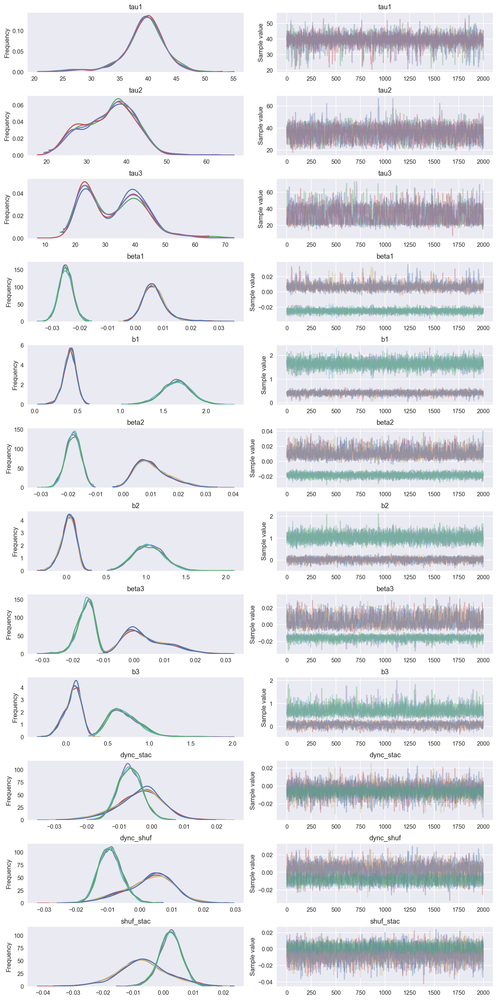

In [23]:
emolabel = 'Anger'
trace_anger = model3_diff(emolabel)
pm.traceplot(trace_anger,varnames=['tau1','tau2','tau3','beta1','b1','beta2','b2','beta3','b3',
                                  'dync_stac','dync_shuf','shuf_stac']);

The accept rate is: 0.81271
Diverge of the trace
(array([  17, 4141, 4254, 5595, 6711]),)


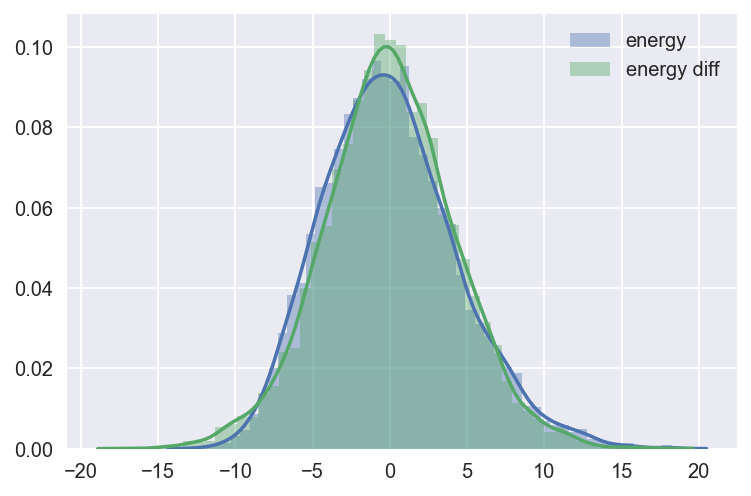

In [29]:
plot_samplerstat(burnin=0, trace=trace_anger);

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Displaying Dynamic condition
Displaying Static condition
Displaying Shuffled condition


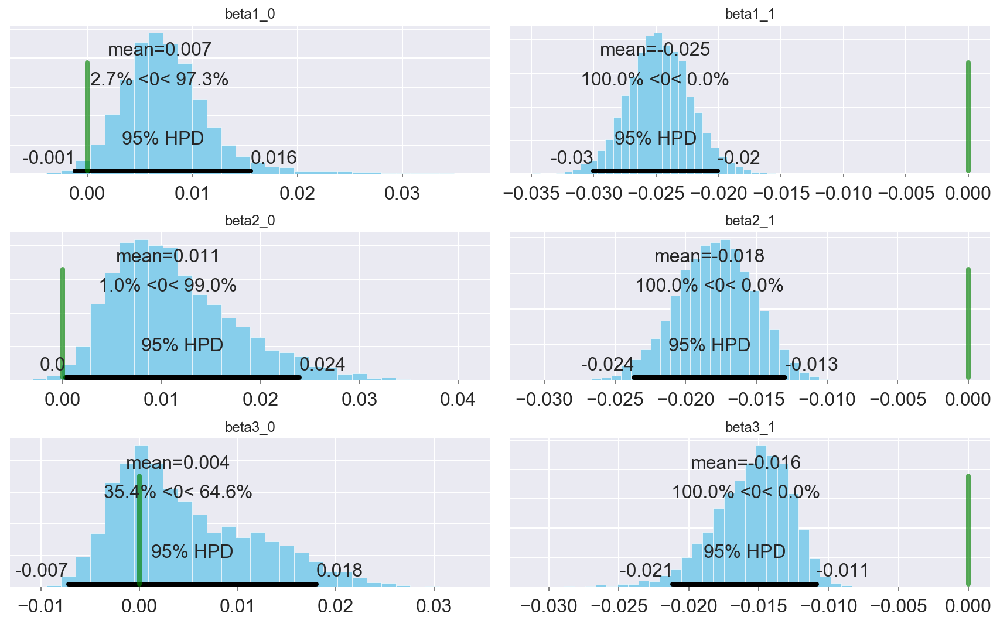

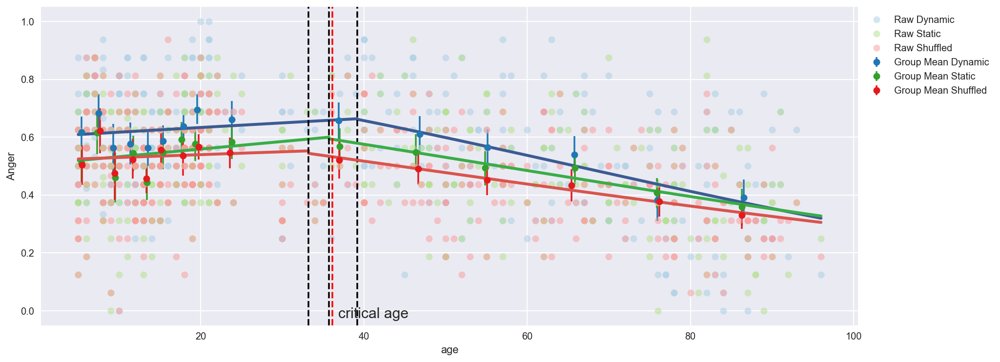

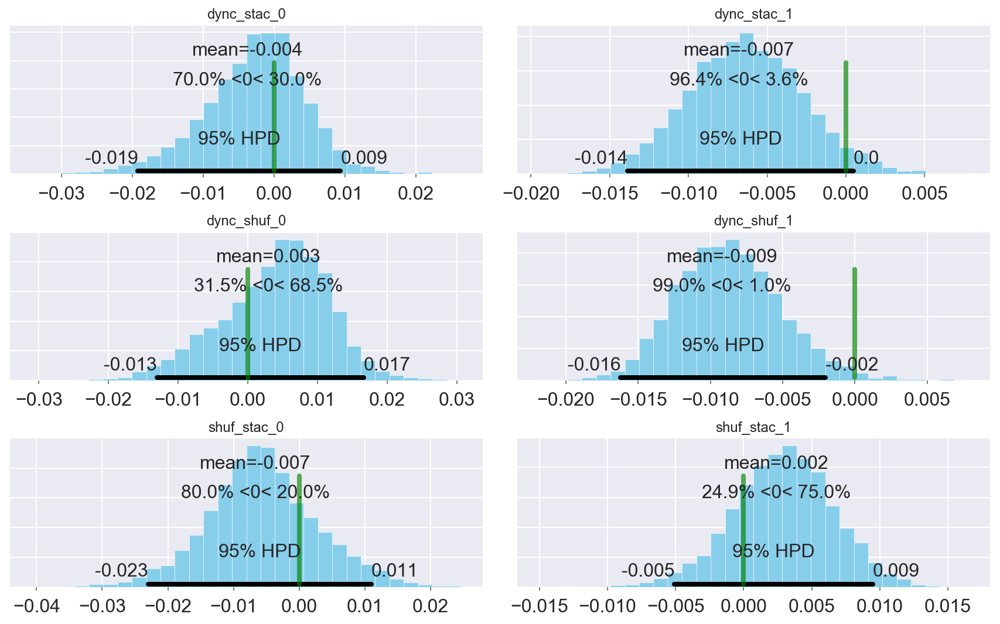

In [30]:
emolabel = 'Anger'
plot_selectposterior(burnin=0, trace=trace_anger);

In [39]:
dfall = df_summary(trace_anger)
dfall

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,rhat,description
mu_beta,-0.006073,0.011264,0.000265,-0.027186,0.015518,1555.0,1.000309,Overall_Slope_Mean
tau1,39.170102,3.894778,0.082438,31.025975,46.844409,2053.0,1.000378,Critical_Age_Dynamic
tau2,35.708172,6.398974,0.121814,23.587839,46.405456,2563.0,1.000619,Critical_Age_Static
tau3,33.218084,9.830760,0.263493,18.126037,49.619541,1494.0,1.000262,Critical_Age_Shuffled
beta1__0,0.006919,0.004438,0.000096,-0.001144,0.015557,1891.0,0.999922,Slope_before_tau_Dynamic
beta1__1,-0.025084,0.002513,0.000036,-0.030040,-0.020067,4852.0,1.000286,Slope_after_tau_Dynamic
beta2__0,0.010672,0.006299,0.000117,0.000326,0.023941,2797.0,1.000268,Slope_before_tau_Static
beta2__1,-0.018282,0.002744,0.000037,-0.023638,-0.012966,4805.0,1.000528,Slope_after_tau_Static
beta3__0,0.003985,0.007040,0.000173,-0.007185,0.018009,1701.0,1.000165,Slope_before_tau_Shuffled
beta3__1,-0.015889,0.002766,0.000057,-0.021141,-0.010843,1956.0,1.000804,Slope_before_tau_Shuffled


### Disgust

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 3,591.1:  85%|████████▌ | 170142/200000 [03:11<00:26, 1145.35it/s] 
Convergence archived at 170200
Interrupted at 170,200 [85%]: Average Loss = 8,569.4
100%|██████████| 3000/3000 [01:21<00:00, 36.99it/s]


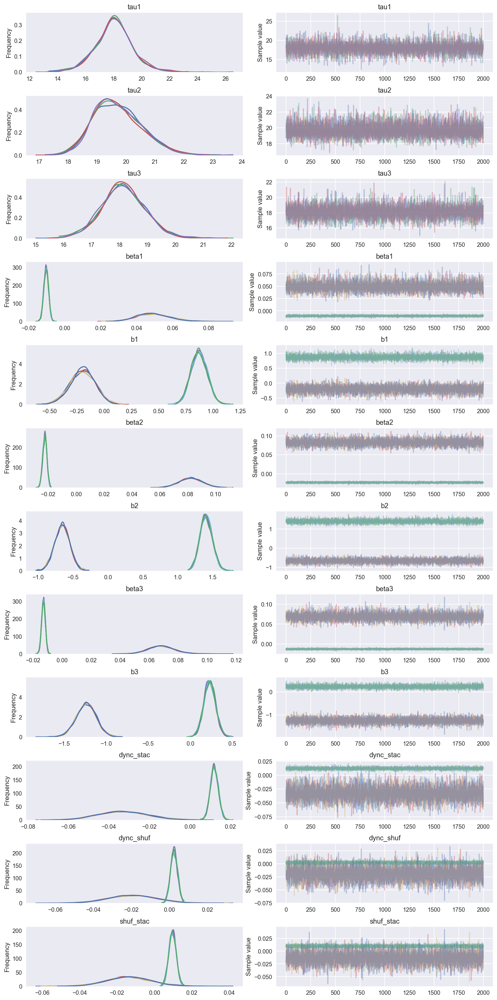

In [26]:
emolabel = 'Disgust'
trace_disgust = model3_diff(emolabel)
pm.traceplot(trace_disgust,varnames=['tau1','tau2','tau3','beta1','b1','beta2','b2','beta3','b3',
                                  'dync_stac','dync_shuf','shuf_stac']);

The accept rate is: 0.81615
Diverge of the trace
(array([], dtype=int64),)


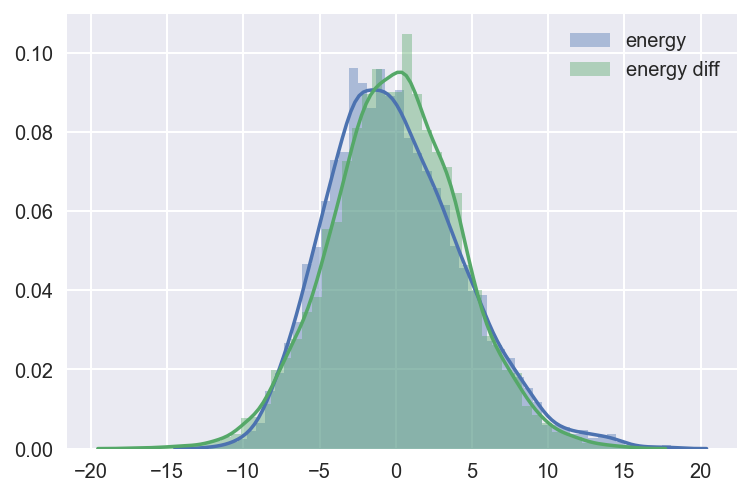

In [40]:
plot_samplerstat(burnin=0, trace=trace_disgust);

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Displaying Dynamic condition
Displaying Static condition
Displaying Shuffled condition


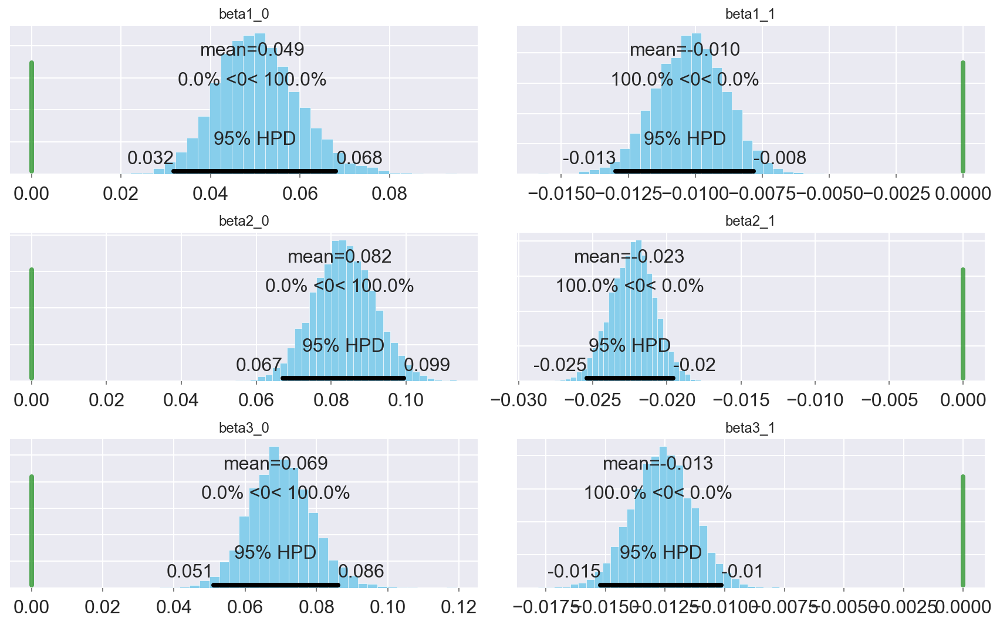

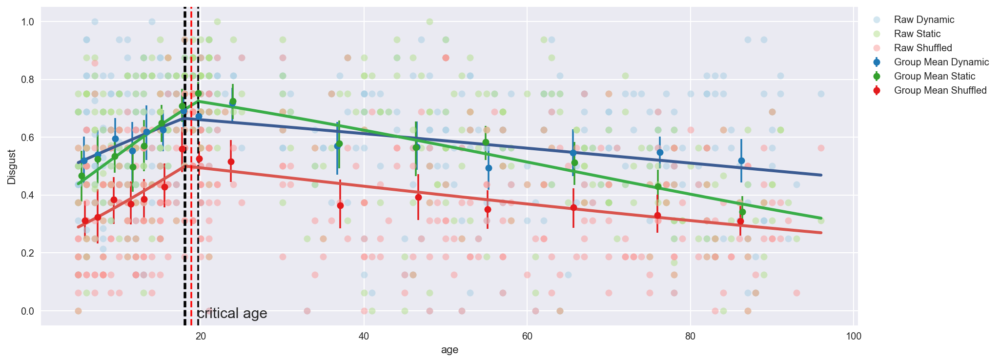

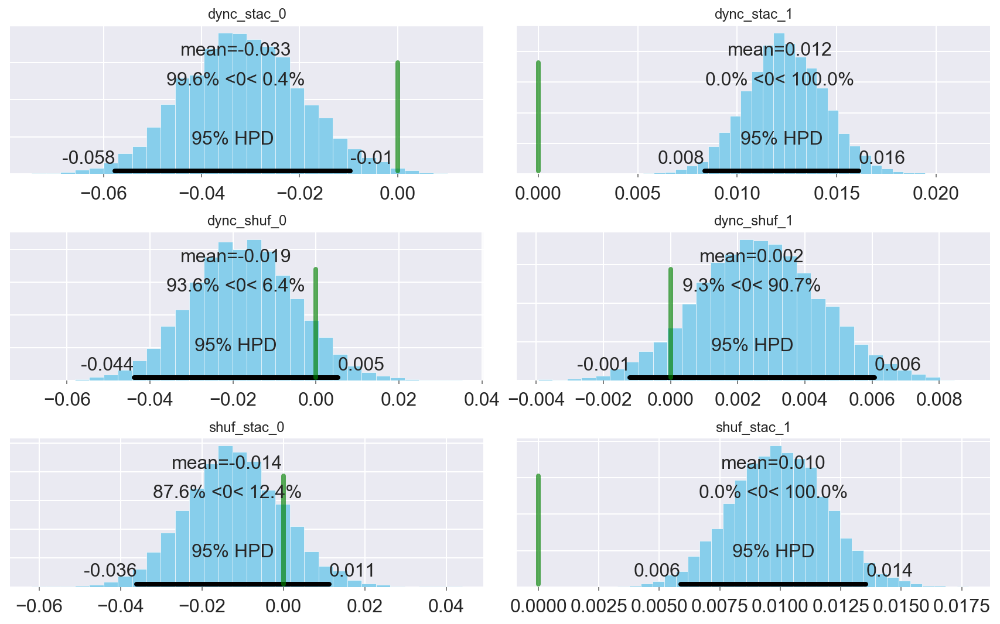

In [41]:
emolabel = 'Disgust'
plot_selectposterior(burnin=0, trace=trace_disgust);

In [42]:
dfall = df_summary(trace_disgust)
dfall

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,rhat,description
mu_beta,0.025514,0.029320,0.000469,-0.030166,0.086247,4092.0,1.000034,Overall_Slope_Mean
tau1,18.021848,1.321645,0.014283,15.384207,20.752465,8000.0,0.999818,Critical_Age_Dynamic
tau2,19.709581,0.832369,0.009358,18.187522,21.379530,7251.0,1.000249,Critical_Age_Static
tau3,18.136307,0.783929,0.007783,16.548703,19.670077,8000.0,0.999837,Critical_Age_Shuffled
beta1__0,0.049369,0.009302,0.000097,0.031836,0.067988,8000.0,0.999927,Slope_before_tau_Dynamic
beta1__1,-0.010377,0.001324,0.000015,-0.012967,-0.007816,7265.0,0.999995,Slope_after_tau_Dynamic
beta2__0,0.082407,0.008230,0.000090,0.067149,0.099345,8000.0,1.000205,Slope_before_tau_Static
beta2__1,-0.022510,0.001482,0.000017,-0.025400,-0.019579,6128.0,0.999849,Slope_after_tau_Static
beta3__0,0.068636,0.008904,0.000090,0.051060,0.086010,8000.0,0.999854,Slope_before_tau_Shuffled
beta3__1,-0.012794,0.001289,0.000014,-0.015210,-0.010152,8000.0,0.999841,Slope_before_tau_Shuffled


### Fear

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 3,241.2:  69%|██████▉   | 138864/200000 [02:10<00:57, 1059.29it/s] 
Convergence archived at 138900
Interrupted at 138,900 [69%]: Average Loss = 8,423.2
100%|██████████| 3000/3000 [01:27<00:00, 38.58it/s]


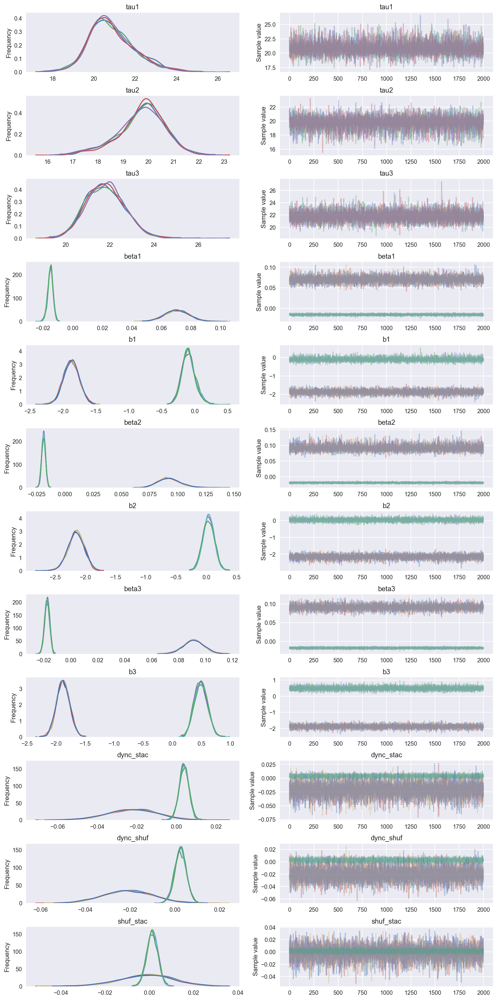

In [29]:
emolabel = 'Fear'
trace_fear = model3_diff(emolabel)
pm.traceplot(trace_fear, varnames=['tau1','tau2','tau3','beta1','b1','beta2','b2','beta3','b3',
                                  'dync_stac','dync_shuf','shuf_stac']);

The accept rate is: 0.81491
Diverge of the trace
(array([], dtype=int64),)


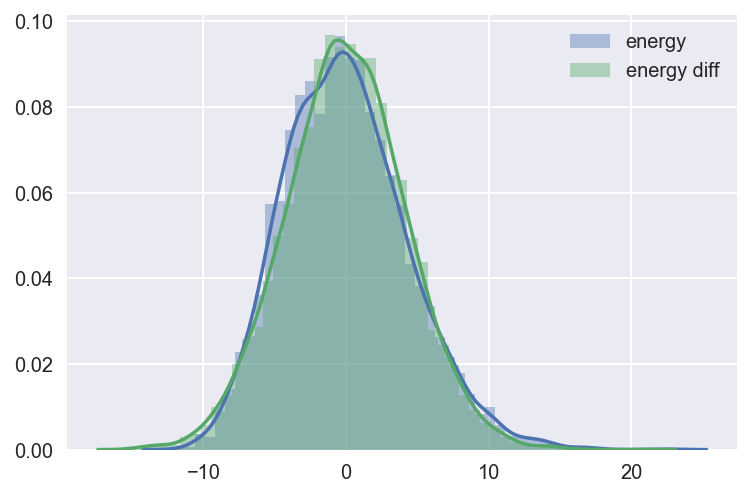

In [43]:
plot_samplerstat(burnin=0, trace=trace_fear);

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Displaying Dynamic condition
Displaying Static condition
Displaying Shuffled condition


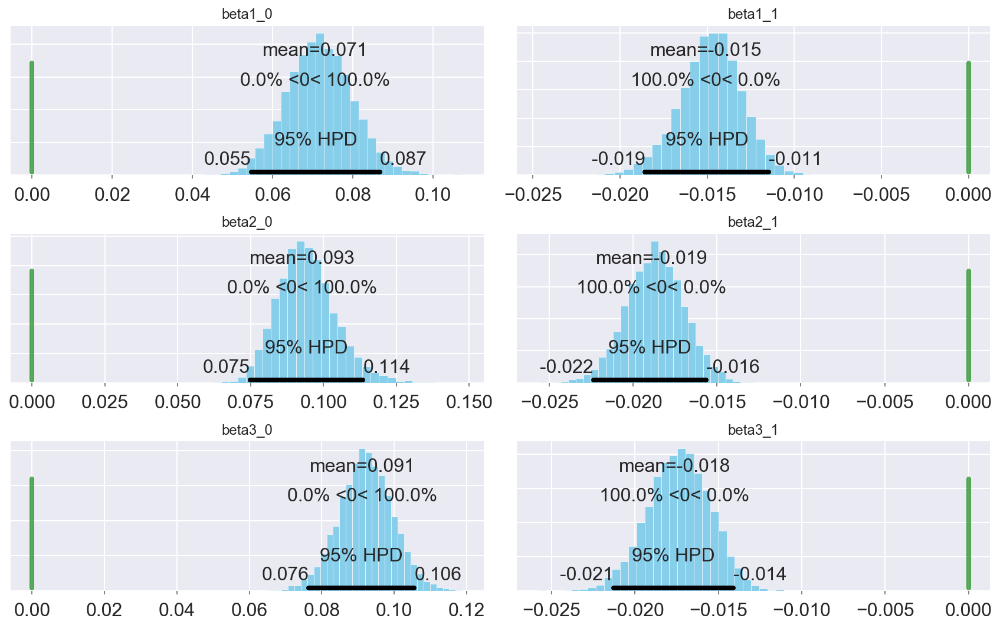

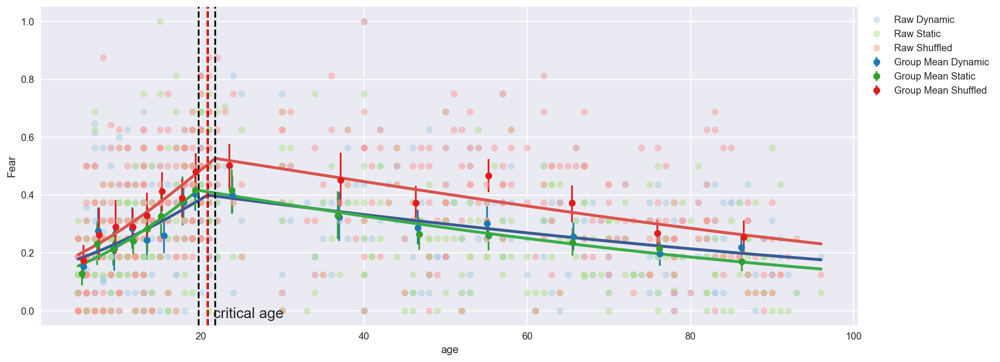

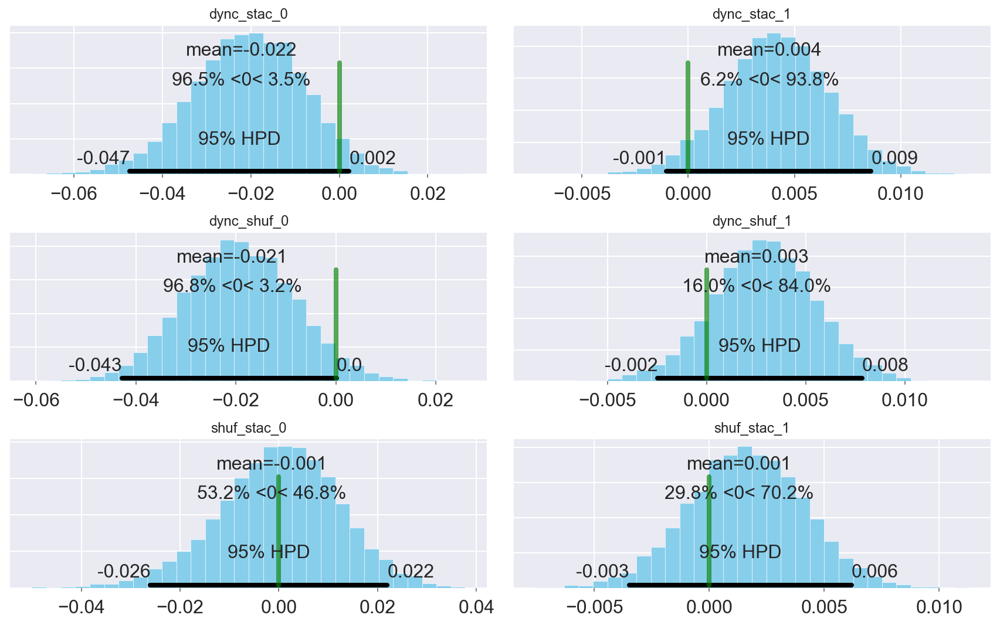

In [44]:
emolabel = 'Fear'
plot_selectposterior(burnin=0, trace=trace_fear);

In [45]:
dfall = df_summary(trace_fear)
dfall

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,rhat,description
mu_beta,0.033481,0.035202,0.000488,-0.037199,0.104313,4413.0,1.000361,Overall_Slope_Mean
tau1,20.868630,1.123623,0.014344,18.708122,23.177252,6343.0,0.999823,Critical_Age_Dynamic
tau2,19.723332,0.931726,0.011364,17.626303,21.428354,6497.0,1.000357,Critical_Age_Static
tau3,21.792974,0.877226,0.009913,20.173529,23.512563,6855.0,1.000559,Critical_Age_Shuffled
beta1__0,0.070573,0.008204,0.000081,0.054635,0.086747,8000.0,0.999852,Slope_before_tau_Dynamic
beta1__1,-0.015078,0.001779,0.000023,-0.018569,-0.011482,6285.0,1.000027,Slope_after_tau_Dynamic
beta2__0,0.092729,0.009962,0.000114,0.074722,0.113529,8000.0,1.000007,Slope_before_tau_Static
beta2__1,-0.018916,0.001713,0.000019,-0.022385,-0.015660,7575.0,0.999798,Slope_after_tau_Static
beta3__0,0.091284,0.007393,0.000068,0.076428,0.105613,8000.0,0.999832,Slope_before_tau_Shuffled
beta3__1,-0.017619,0.001853,0.000023,-0.021277,-0.014092,7149.0,1.000347,Slope_before_tau_Shuffled


### Happy

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 2,560.1:  22%|██▏       | 43551/200000 [00:30<01:49, 1425.33it/s]  
Convergence archived at 43600
Interrupted at 43,600 [21%]: Average Loss = 27,840
100%|█████████▉| 2998/3000 [04:07<00:00, 11.42it/s]/Users/jlao/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:451: UserWarning: The acceptance probability in chain 0 does not match the target. It is 0.561399206305, but should be close to 0.8. Try to increase the number of tuning steps.
  % (self._chain_id, mean_accept, target_accept))
/Users/jlao/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:467: UserWarning: Chain 0 contains 125 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 3000/3000 [04:07<00:00, 12.11it/s]
/Users/jlao/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:451: UserWarning: The acceptance probability in chain 3 does 

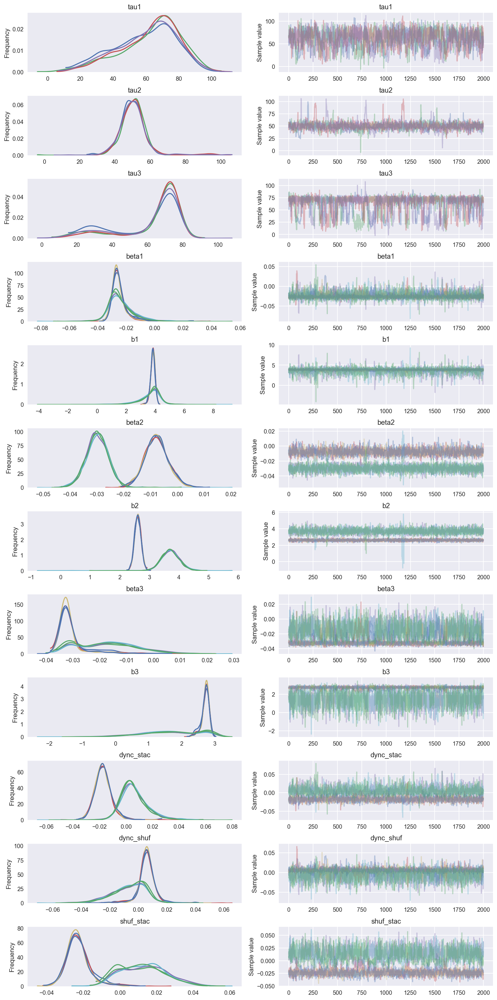

In [32]:
emolabel = 'Happy'
trace_happy = model3_diff(emolabel)
pm.traceplot(trace_happy,varnames=['tau1','tau2','tau3','beta1','b1','beta2','b2','beta3','b3',
                                  'dync_stac','dync_shuf','shuf_stac']);

The accept rate is: 0.76920
Diverge of the trace
(array([  76,   81,   87,   91,   92,   93,  106,  113,  114,  115,  116,
        118,  120,  213,  226,  303,  334,  361,  363,  365,  367,  374,
        375,  376,  377,  378,  379,  380,  382,  383,  443,  444,  445,
        446,  447,  448,  450,  451,  452,  550,  560,  594,  599,  600,
        602,  605,  617,  618,  752,  763,  826,  827,  829,  831,  833,
        835,  837,  839,  840,  842,  844,  845,  846,  848,  849,  850,
        851,  854,  855,  856,  857,  858,  859,  860,  863,  864,  872,
        961,  962,  965,  971,  977,  979,  980,  981,  983,  985,  987,
        991,  992,  993,  995,  998, 1008, 1298, 1310, 1312, 1313, 1315,
       1399, 1405, 1408, 1413, 1420, 1422, 1423, 1424, 1425, 1440, 1550,
       1552, 1557, 1558, 1559, 1612, 1746, 1757, 1846, 1855, 1859, 1861,
       1894, 1899, 1957, 1992]),)


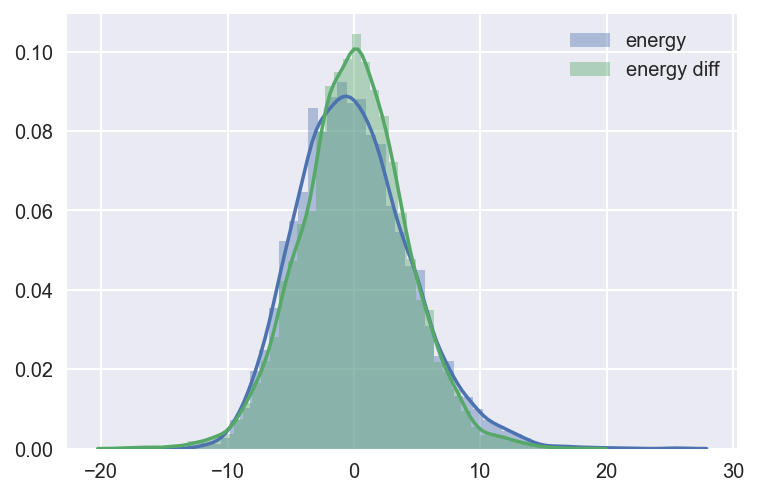

In [46]:
plot_samplerstat(burnin=0, trace=trace_happy);

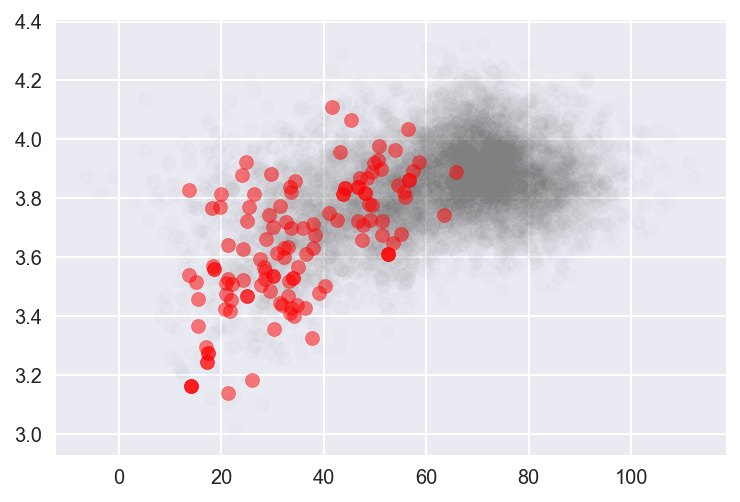

In [47]:
diverge = trace_happy.get_sampler_stats('diverging')
# trace_happy['beta1'].shape
colors = ['grey','red']
plt.scatter(trace_happy['tau1'][~diverge], trace_happy['b1'][~diverge,0],c=colors[0], alpha=.025)
plt.scatter(trace_happy['tau1'][diverge], trace_happy['b1'][diverge,0],c=colors[1], alpha=.5);

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Displaying Dynamic condition
Displaying Static condition
Displaying Shuffled condition


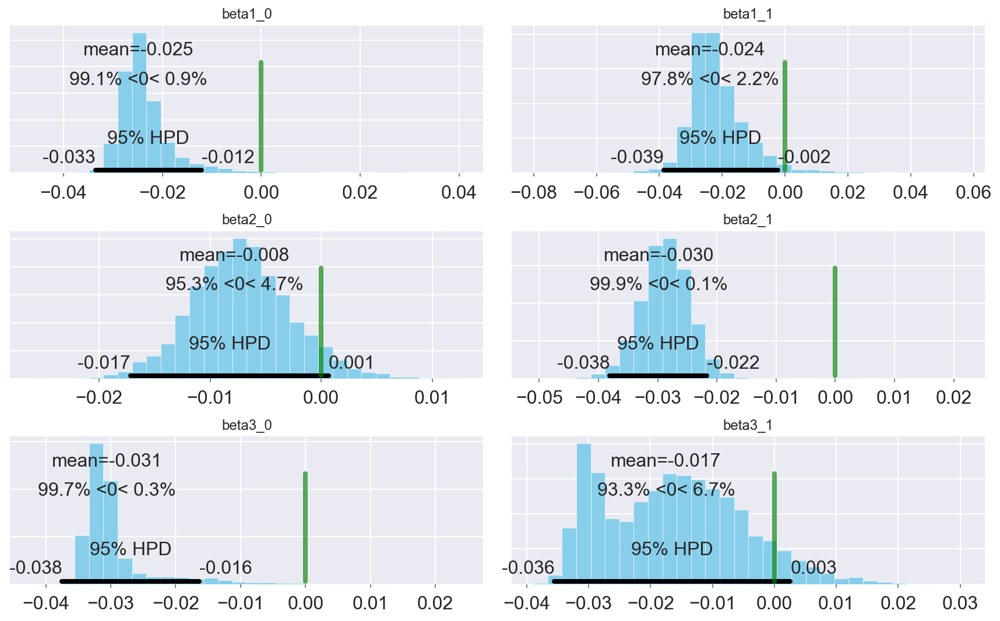

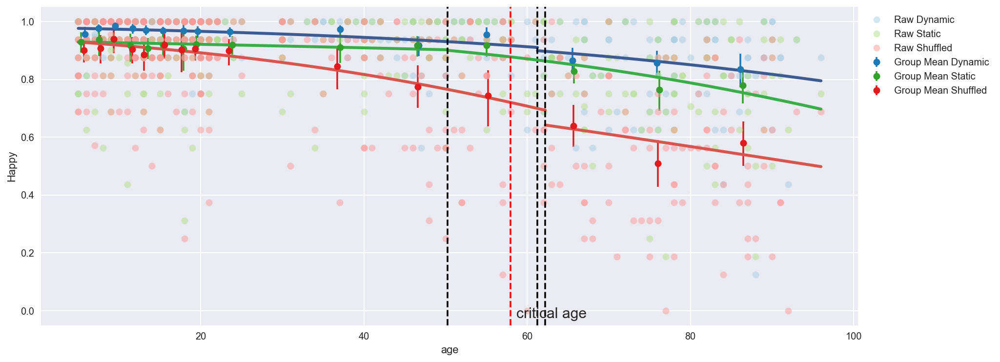

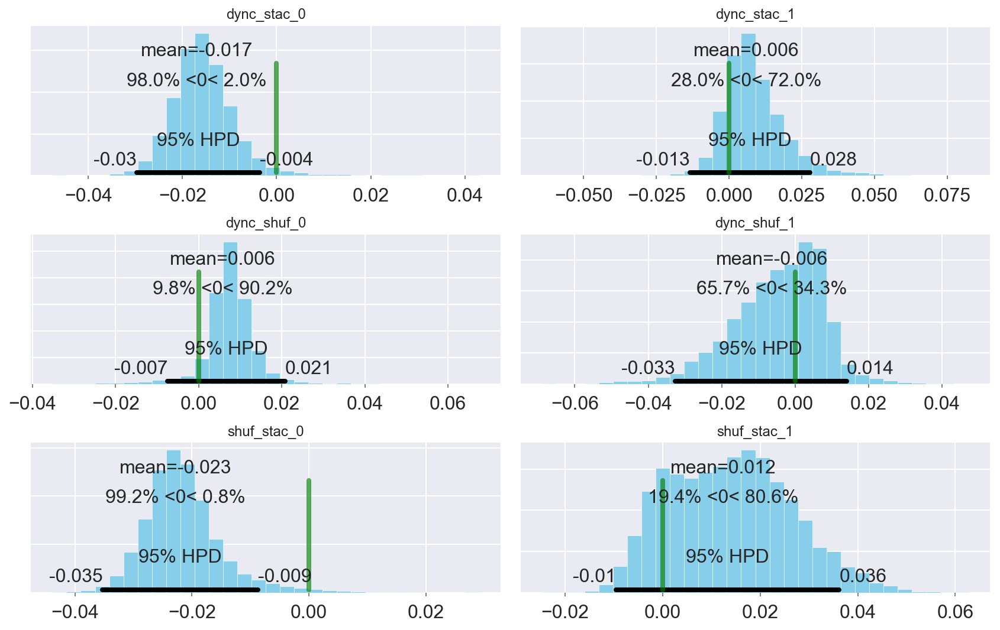

In [48]:
emolabel = 'Happy'
plot_selectposterior(burnin=0, trace=trace_happy);

In [49]:
dfall = df_summary(trace_happy)
dfall

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,rhat,description
mu_beta,-0.022491,0.008808,0.000227,-0.037241,-0.007258,1393.0,1.001981,Overall_Slope_Mean
tau1,61.270323,18.358075,0.805181,24.181984,93.420610,468.0,1.005137,Critical_Age_Dynamic
tau2,50.248644,7.786477,0.300060,35.901785,62.014947,638.0,1.001970,Critical_Age_Static
tau3,62.221168,18.045359,0.970201,21.948789,80.995666,293.0,1.006401,Critical_Age_Shuffled
beta1__0,-0.024789,0.006361,0.000230,-0.033498,-0.012090,691.0,1.002538,Slope_before_tau_Dynamic
beta1__1,-0.023881,0.009412,0.000231,-0.038660,-0.002337,1851.0,1.001655,Slope_after_tau_Dynamic
beta2__0,-0.007796,0.004477,0.000115,-0.017170,0.000682,1414.0,1.000552,Slope_before_tau_Static
beta2__1,-0.029845,0.004511,0.000107,-0.038107,-0.021695,1859.0,1.000421,Slope_after_tau_Static
beta3__0,-0.030600,0.005943,0.000307,-0.037506,-0.016313,300.0,1.004760,Slope_before_tau_Shuffled
beta3__1,-0.017487,0.011130,0.000462,-0.035547,0.002591,483.0,1.006243,Slope_before_tau_Shuffled


### Sad

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 3,445.4:  85%|████████▌ | 170665/200000 [02:29<00:21, 1376.56it/s] 
Convergence archived at 170700
Interrupted at 170,700 [85%]: Average Loss = 8,298.8
100%|██████████| 3000/3000 [01:33<00:00, 32.03it/s]

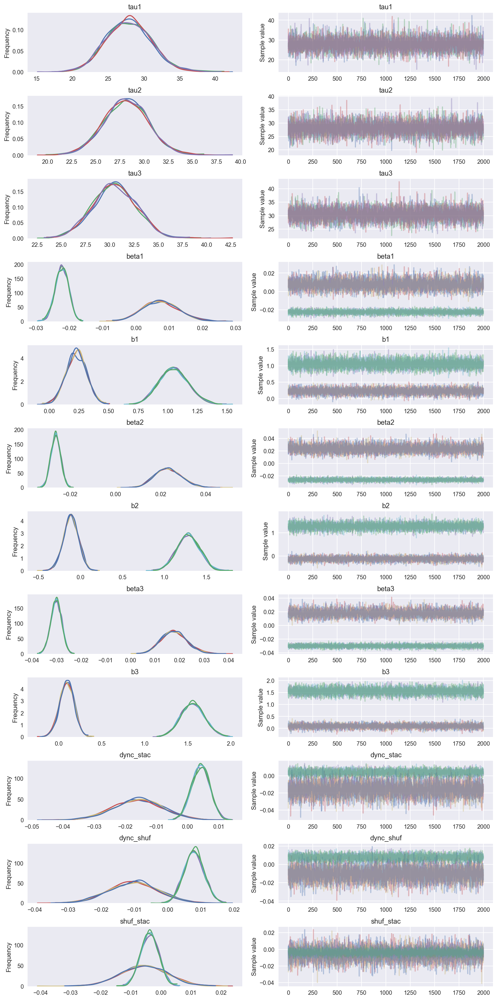

In [36]:
emolabel = 'Sad'
trace_sad = model3_diff(emolabel)
pm.traceplot(trace_sad,varnames=['tau1','tau2','tau3','beta1','b1','beta2','b2','beta3','b3',
                                  'dync_stac','dync_shuf','shuf_stac']);

The accept rate is: 0.81510
Diverge of the trace
(array([], dtype=int64),)


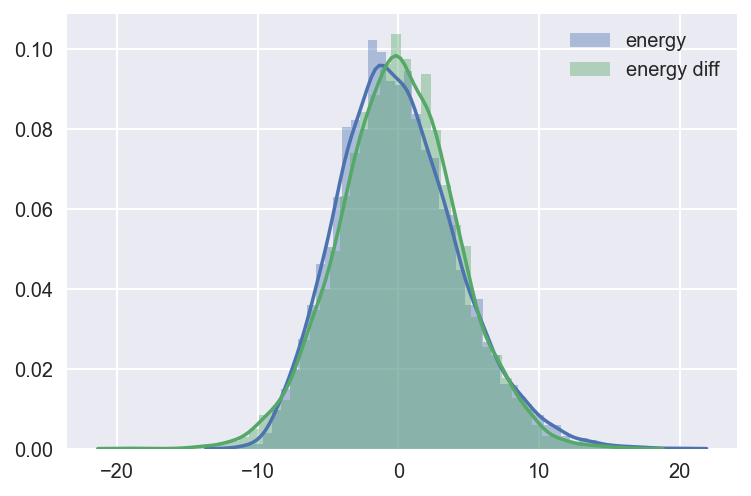

In [50]:
plot_samplerstat(burnin=0, trace=trace_sad);

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Displaying Dynamic condition
Displaying Static condition
Displaying Shuffled condition


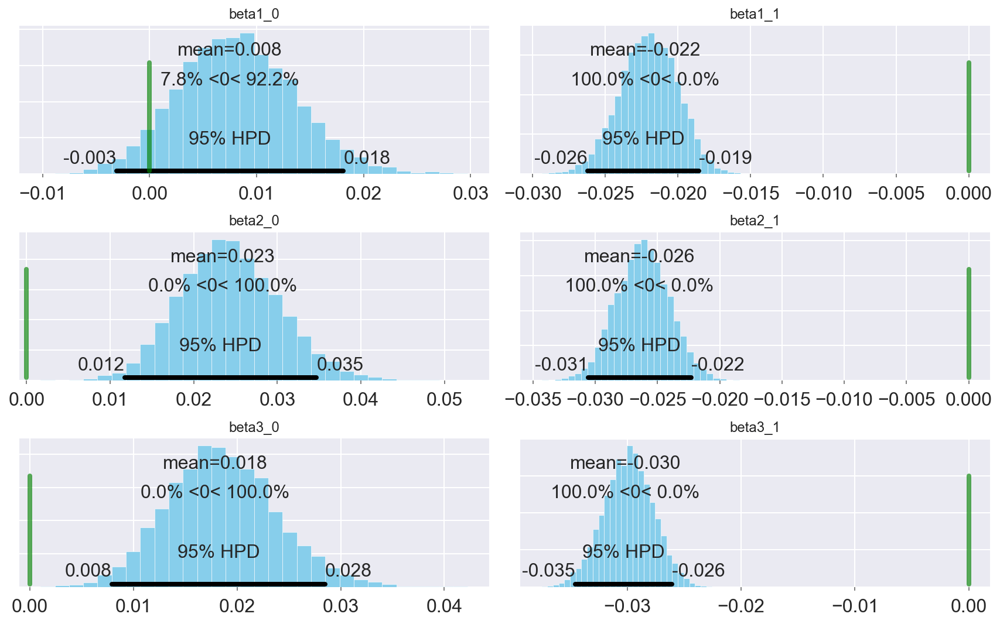

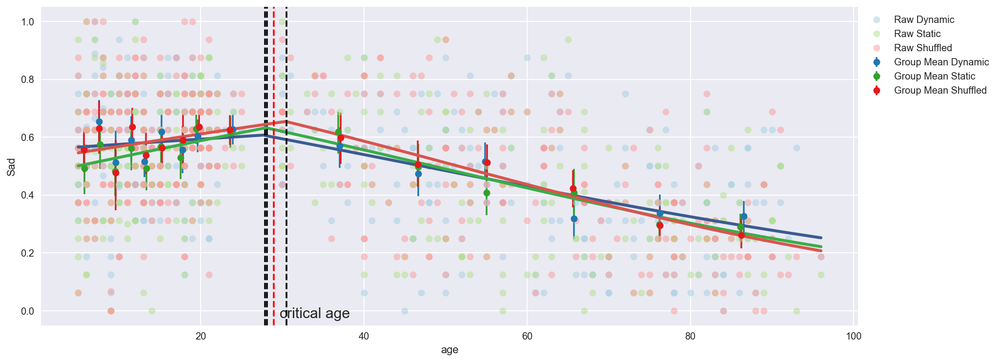

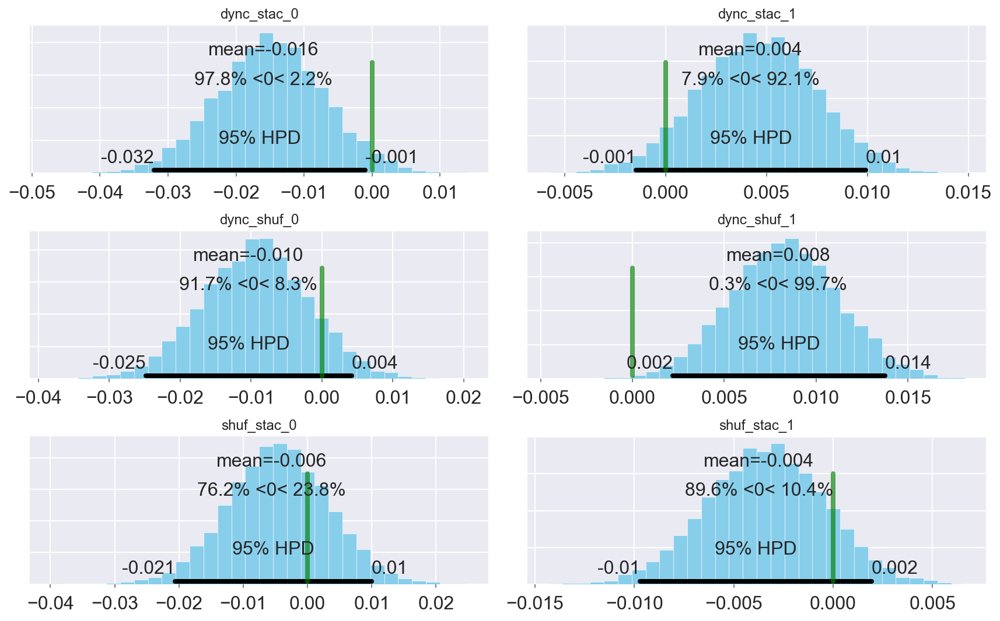

In [51]:
emolabel = 'Sad'
plot_selectposterior(burnin=0, trace=trace_sad);

In [52]:
dfall = df_summary(trace_sad)
dfall

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,rhat,description
mu_beta,-0.004629,0.015252,0.000247,-0.035014,0.025122,3846.0,1.000017,Overall_Slope_Mean
tau1,27.867290,3.207274,0.037807,21.440546,33.901065,6513.0,1.000178,Critical_Age_Dynamic
tau2,28.120490,2.318238,0.027045,23.504010,32.621302,7391.0,0.999827,Critical_Age_Static
tau3,30.521039,2.267036,0.026694,26.054899,34.743818,7498.0,1.000492,Critical_Age_Shuffled
beta1__0,0.007512,0.005453,0.000068,-0.003103,0.018111,5033.0,1.000247,Slope_before_tau_Dynamic
beta1__1,-0.022255,0.001992,0.000022,-0.026222,-0.018550,8000.0,0.999954,Slope_after_tau_Dynamic
beta2__0,0.023467,0.005933,0.000071,0.011738,0.034693,6957.0,0.999939,Slope_before_tau_Static
beta2__1,-0.026456,0.002144,0.000022,-0.030588,-0.022295,8000.0,0.999784,Slope_after_tau_Static
beta3__0,0.017870,0.005260,0.000070,0.007894,0.028498,6233.0,1.000456,Slope_before_tau_Shuffled
beta3__1,-0.030188,0.002174,0.000023,-0.034592,-0.026075,8000.0,0.999954,Slope_before_tau_Shuffled


### Surprise

Auto-assigning NUTS sampler...
Initializing NUTS using advi+adapt_diag...
Average Loss = 3,511.3:  72%|███████▏  | 143979/200000 [01:59<01:02, 891.86it/s]  
Convergence archived at 144000
Interrupted at 144,000 [72%]: Average Loss = 9,553.5
100%|██████████| 3000/3000 [01:58<00:00, 25.24it/s]


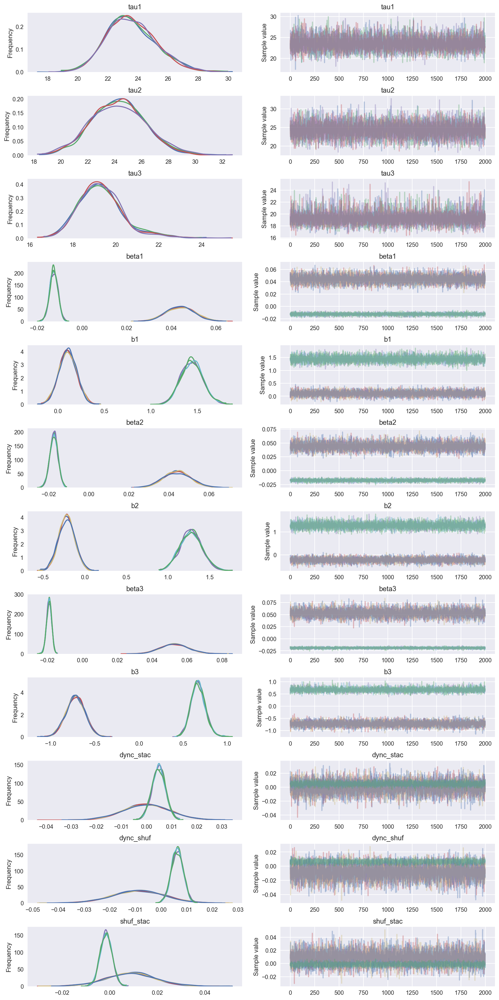

In [39]:
emolabel = 'Surprise'
trace_surprise = model3_diff(emolabel)
pm.traceplot(trace_surprise,varnames=['tau1','tau2','tau3','beta1','b1','beta2','b2','beta3','b3',
                                  'dync_stac','dync_shuf','shuf_stac']);

The accept rate is: 0.81098
Diverge of the trace
(array([], dtype=int64),)


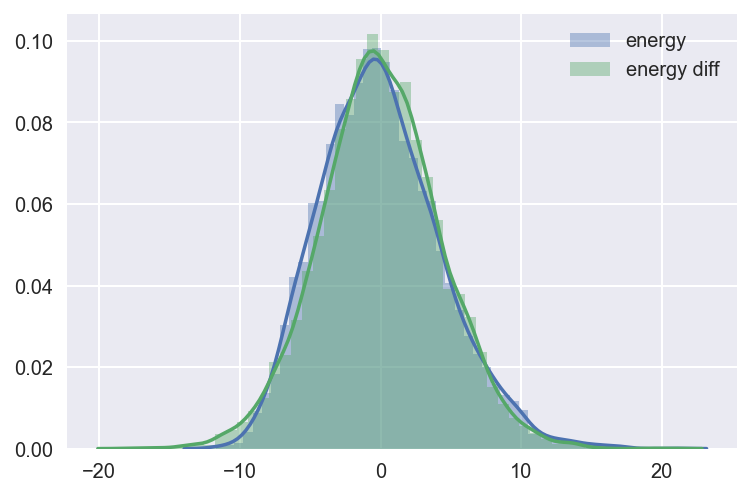

In [53]:
plot_samplerstat(burnin=0, trace=trace_surprise);

/Library/Frameworks/Python.framework/Versions/3.5/lib/python3.5/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The set_color_cycle attribute was deprecated in version 1.5. Use set_prop_cycle instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Displaying Dynamic condition
Displaying Static condition
Displaying Shuffled condition


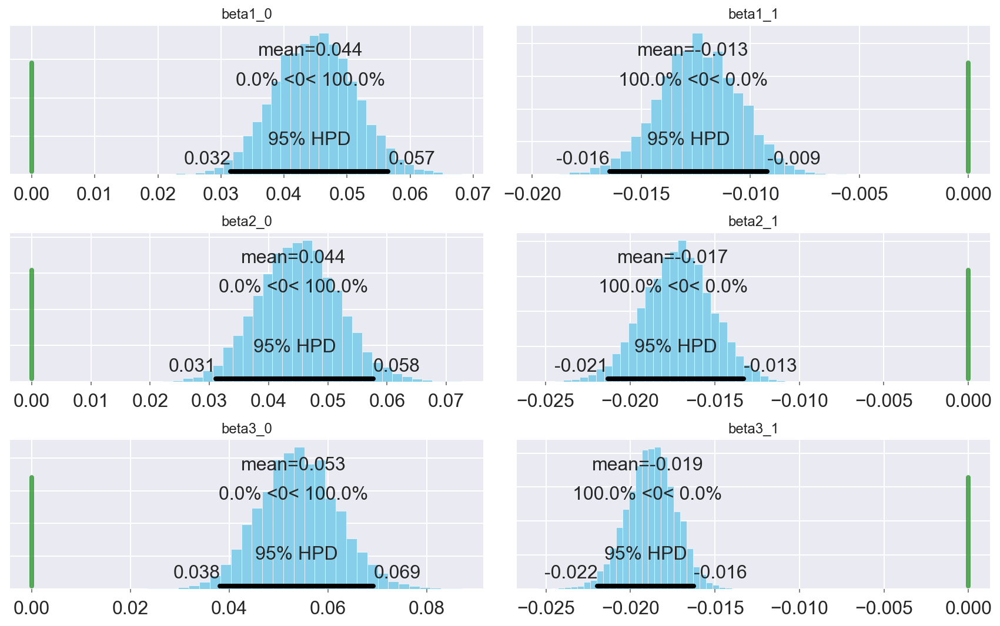

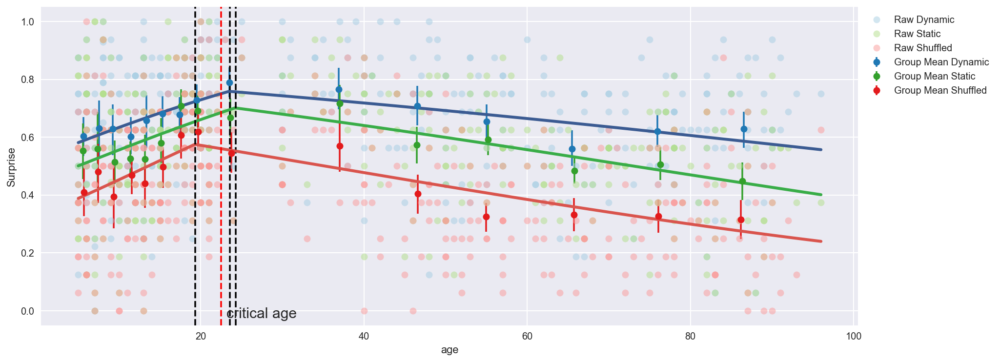

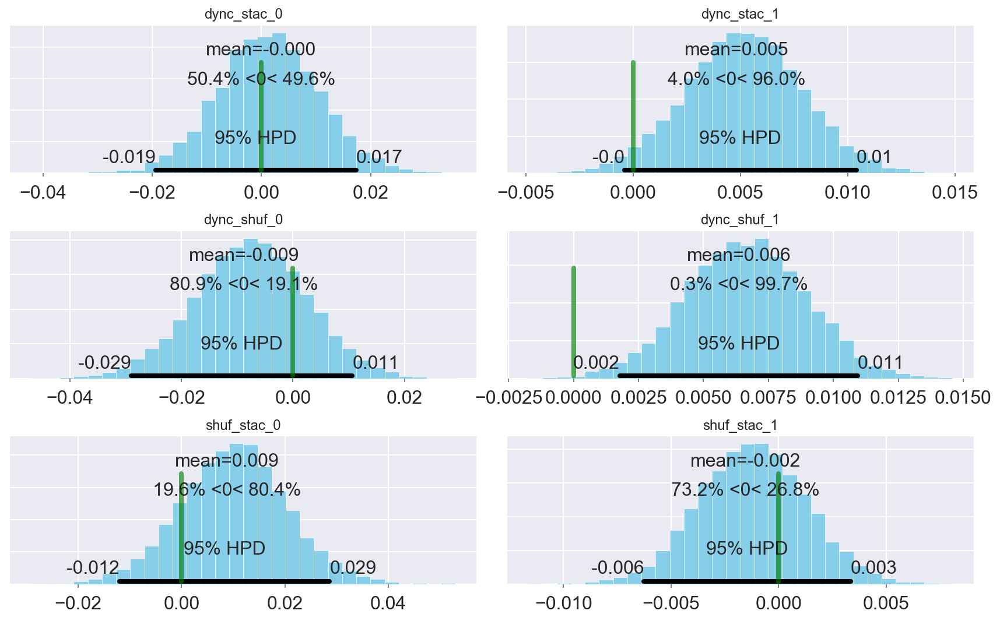

In [54]:
emolabel = 'Surprise'
plot_selectposterior(burnin=0, trace=trace_surprise)

In [55]:
dfall = df_summary(trace_surprise)
dfall

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,rhat,description
mu_beta,0.015643,0.022192,0.000296,-0.028619,0.058847,5001.0,1.000254,Overall_Slope_Mean
tau1,23.547252,1.651729,0.018069,20.522774,26.914040,7044.0,0.999883,Critical_Age_Dynamic
tau2,24.300820,2.008806,0.024173,20.360051,28.258751,6181.0,0.999919,Critical_Age_Static
tau3,19.340769,1.093436,0.016073,17.336744,21.758297,4806.0,0.999942,Critical_Age_Shuffled
beta1__0,0.044166,0.006430,0.000067,0.031534,0.056537,8000.0,0.999859,Slope_before_tau_Dynamic
beta1__1,-0.012628,0.001843,0.000022,-0.016448,-0.009222,5972.0,0.999913,Slope_after_tau_Dynamic
beta2__0,0.044213,0.006803,0.000075,0.031074,0.057681,8000.0,0.999904,Slope_before_tau_Static
beta2__1,-0.017452,0.002035,0.000025,-0.021305,-0.013275,5902.0,0.999799,Slope_after_tau_Static
beta3__0,0.052990,0.007976,0.000087,0.038127,0.069203,6826.0,1.000069,Slope_before_tau_Shuffled
beta3__1,-0.018988,0.001452,0.000018,-0.021952,-0.016267,5675.0,0.999837,Slope_before_tau_Shuffled


In [44]:
import pickle
tracedump = {'trace_anger': trace_anger, 
             'trace_disgust': trace_disgust, 
             'trace_fear': trace_fear, 
             'trace_happy': trace_happy, 
             'trace_sad': trace_sad, 
             'trace_surprise': trace_surprise}
with open('trace_20170830.pickle', 'wb') as f:
    pickle.dump(tracedump, f)

In [18]:
# import pickle
# with open('trace_20170830.pickle', 'rb') as f:
#     tracedump = pickle.load(f)
# trace_anger = tracedump['trace_anger']
# trace_disgust = tracedump['trace_disgust']
# trace_fear = tracedump['trace_fear']
# trace_happy = tracedump['trace_happy']
# trace_sad = tracedump['trace_sad']
# trace_surprise = tracedump['trace_surprise']

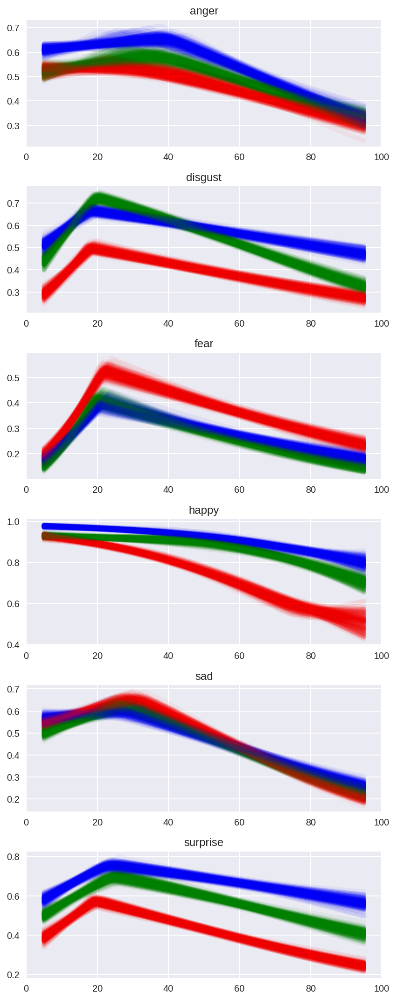

In [19]:
expression = ['anger', 'disgust', 'fear', 'happy', 'sad', 'surprise']
Nt = 16
cc = ['b', 'g', 'r']
taskname = ['Dynamic','Static','Shuffled']
nsample = 200
timelen = 250
X1 = np.linspace(5,95,timelen)

fig, ax= plt.subplots(6, 1, figsize=(6,15))
mu_mat = np.zeros((nsample,3,timelen,len(expression)))
for ij, iexp in enumerate(expression):
    tracetmp = tracedump['trace_'+iexp]
    tracelen = tracetmp['tau1'].shape[0]
    
    ax[ij].set_title(iexp)
    
    taupost = theano.shared(tracetmp['tau1'][0])
    betapost = theano.shared(tracetmp['beta1'][0])
    bpost = theano.shared(tracetmp['b1'][0])
    betavec_p = pm.math.switch(taupost >= X1, betapost[0], betapost[1])
    bvec_p = pm.math.switch(taupost >= X1, bpost[0], bpost[1])
    theta_p = betavec_p * X1 + bvec_p
    yhat_p = pm.math.invlogit(theta_p)

    for iss in range(nsample):
        idx = np.random.randint(0, tracelen)
        for itask in range(1,4):
            taupost.set_value(tracetmp['tau'+str(itask)][idx])
            betapost.set_value(tracetmp['beta'+str(itask)][idx])
            bpost.set_value(tracetmp['b'+str(itask)][idx])
            
            ypost = yhat_p.eval()
            ax[ij].plot(X1, ypost, color=cc[itask-1], alpha=.05, lw=5)
            mu_mat[iss,itask-1,:,ij]=ypost
            #ypost_ = np.random.binomial(Nt, ypost)
            #plt.scatter(X1, ypost_, color=cc[itask-1], alpha=.05)
    ax[ij].set_xlim(0, 100)

plt.tight_layout()

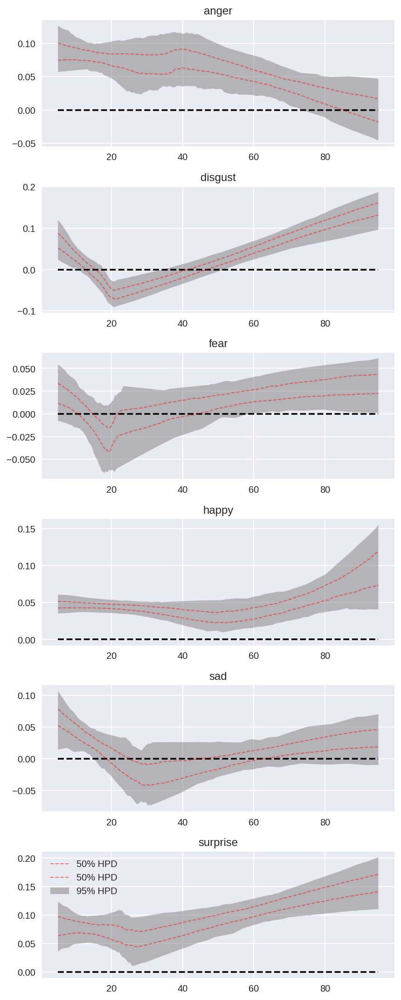

In [21]:
#%% Diff (Dynamic-Static)
ci95 = np.percentile(mu_mat[:,0,:,:]-mu_mat[:,1,:,:], [2.5,97.5], axis=0)
ci50 = np.percentile(mu_mat[:,0,:,:]-mu_mat[:,1,:,:], [25,75], axis=0)
fig, ax= plt.subplots(6, 1, figsize=(6,15))
for ij, iexp in enumerate(expression):
    ax[ij].set_title(iexp)
    ax[ij].fill_between(X1, ci95[0,:,ij], ci95[1,:,ij], 
      facecolor='gray', alpha=.5, label='95% HPD')
    ax[ij].plot(X1, ci50[:,:,ij].T, '--', color='r', alpha=.5, lw=1, label='50% HPD')
    ax[ij].hlines(0, 5, 95, linestyles='--')
plt.tight_layout()
plt.legend();